# <a name="0">Hierarchical Clustering</a>

1. <a href="#0">Read the dataset</a>
2. <a href="#2">Data investigation</a>
3. <a href="#3">Data preprocessing </a>
4. <a href="#4">Features transformation </a>
5. <a href="#5">K means</a>
6. <a href="#5">Training datasets</a>
7. <a href="#6">Improvement ideas</a>



In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA, KernelPCA
from sklearn.cluster import DBSCAN


# just to get multuple output from the same cell.
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [92]:
def Bar(df,Column_name,bins):
  """Plot a menengful bar plot.

    Args:
        df (Pandas Dataframe): DataFrame with all the records.
        Column_name (string): the name of the column we wont to plot.
        bins (list): Deviding our bar plot acording to those bins.
  """
  plt.figure(figsize=(18,7))
  freq, bins, p = plt.hist(df[Column_name], bins=bins,rwidth=0.9)

  # x coordinate for labels
  bin_centers = np.diff(bins)*0.5 + bins[:-1]

  n = 0
  for fr, x, patch in zip(freq, bin_centers,p):
    height = int(freq[n])
    plt.annotate("{}%".format(round(height*100 / df.shape[0],2)),
                xy = (x, height),
                xytext = (0,0.2),
                textcoords = "offset points",
                ha = 'center', va = 'bottom'
                )
    n = n+1
  plt.grid()
  plt.xticks(bins)
  plt.title(Column_name)
  plt.show;

## 1. <a name="1">Read the dataset</a>
(<a href="#0">Go to top</a>)

First dowmload the data set from this link https://www.kaggle.com/code/sadkoktaybicici/credit-card-data-clustering-k-mean/data
then import it in python.

In [5]:
#read the data

data_path = 'D:\Study\ITI\Machine Learning 2\PCA\CC GENERAL.csv'  #the path where you downloaded the data
df = pd.read_csv(data_path)

print('The shape of the dataset is:', df.shape)

The shape of the dataset is: (8950, 18)


In [5]:
df.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


## 2. <a name="2">Data investigation</a>
(<a href="#0">Go to top</a>)

in this part you need to check the data quality and assess any issues in the data as:
- null values in each column
- each column has the proper data type
- outliers
- duplicate rows
- distribution for each column (skewness)
<br>

**comment each issue you find**

In [6]:
# Let's see the data types and non-null values for each column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

Single null value at `CREDIT_LIMIT`, and 313 null values at `MINIMUM_PAYMENTS`.<br>
each column has the proper data type exept for `CUST_ID` which has no menneing so will be droped.

In [7]:
round(df.isnull().sum(axis=0)*100/df.shape[0],2)

CUST_ID                             0.00
BALANCE                             0.00
BALANCE_FREQUENCY                   0.00
PURCHASES                           0.00
ONEOFF_PURCHASES                    0.00
INSTALLMENTS_PURCHASES              0.00
CASH_ADVANCE                        0.00
PURCHASES_FREQUENCY                 0.00
ONEOFF_PURCHASES_FREQUENCY          0.00
PURCHASES_INSTALLMENTS_FREQUENCY    0.00
CASH_ADVANCE_FREQUENCY              0.00
CASH_ADVANCE_TRX                    0.00
PURCHASES_TRX                       0.00
CREDIT_LIMIT                        0.01
PAYMENTS                            0.00
MINIMUM_PAYMENTS                    3.50
PRC_FULL_PAYMENT                    0.00
TENURE                              0.00
dtype: float64

Since the null values are only 3.5% of the data, we can drob them.

In [ ]:
# This will print basic statistics for numerical columns
df.describe().T

,count,mean,std,min,25%,50%,75%,max
BALANCE,8636.0,1601.224893,2095.571300,0.000000,148.095189,916.855459,2105.195853,19043.13856
BALANCE_FREQUENCY,8636.0,0.895035,0.207697,0.000000,0.909091,1.000000,1.000000,1.00000
PURCHASES,8636.0,1025.433874,2167.107984,0.000000,43.367500,375.405000,1145.980000,49039.57000
ONEOFF_PURCHASES,8636.0,604.901438,1684.307803,0.000000,0.000000,44.995000,599.100000,40761.25000
INSTALLMENTS_PURCHASES,8636.0,420.843533,917.245182,0.000000,0.000000,94.785000,484.147500,22500.00000
CASH_ADVANCE,8636.0,994.175523,2121.458303,0.000000,0.000000,0.000000,1132.385490,47137.21176
PURCHASES_FREQUENCY,8636.0,0.496000,0.401273,0.000000,0.083333,0.500000,0.916667,1.00000
ONEOFF_PURCHASES_FREQUENCY,8636.0,0.205909,0.300054,0.000000,0.000000,0.083333,0.333333,1.00000
PURCHASES_INSTALLMENTS_FREQUENCY,8636.0,0.368820,0.398093,0.000000,0.000000,0.166667,0.750000,1.00000
CASH_ADVANCE_FREQUENCY,8636.0,0.137604,0.201791,0.000000,0.000000,0.000000,0.250000,1.50000


In [ ]:
df.duplicated().sum()

0

No duplicated rows.

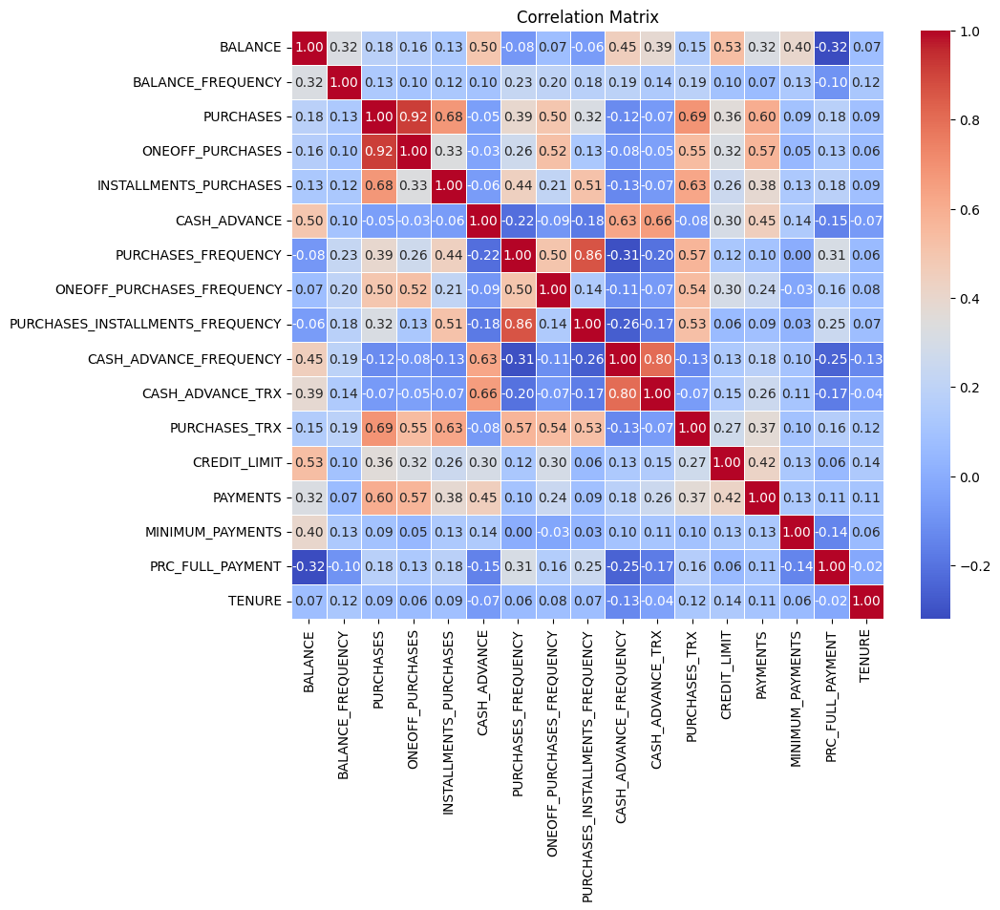

In [ ]:
correlation_matrix = df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

Many features are highly correlated like : <br>
`PURCHASES` and `ONEOFF_PURCHASES` <Br>
`PURCHASES` and `INSTALLMENTS_PURCHASES` <br>
`CASH_ADVANCE_FREQUENCY` and `CASH_ADVANCE_TRX` <br>
and so on.... The similarity in their names suggests they are calculated ( depends ) on one another.


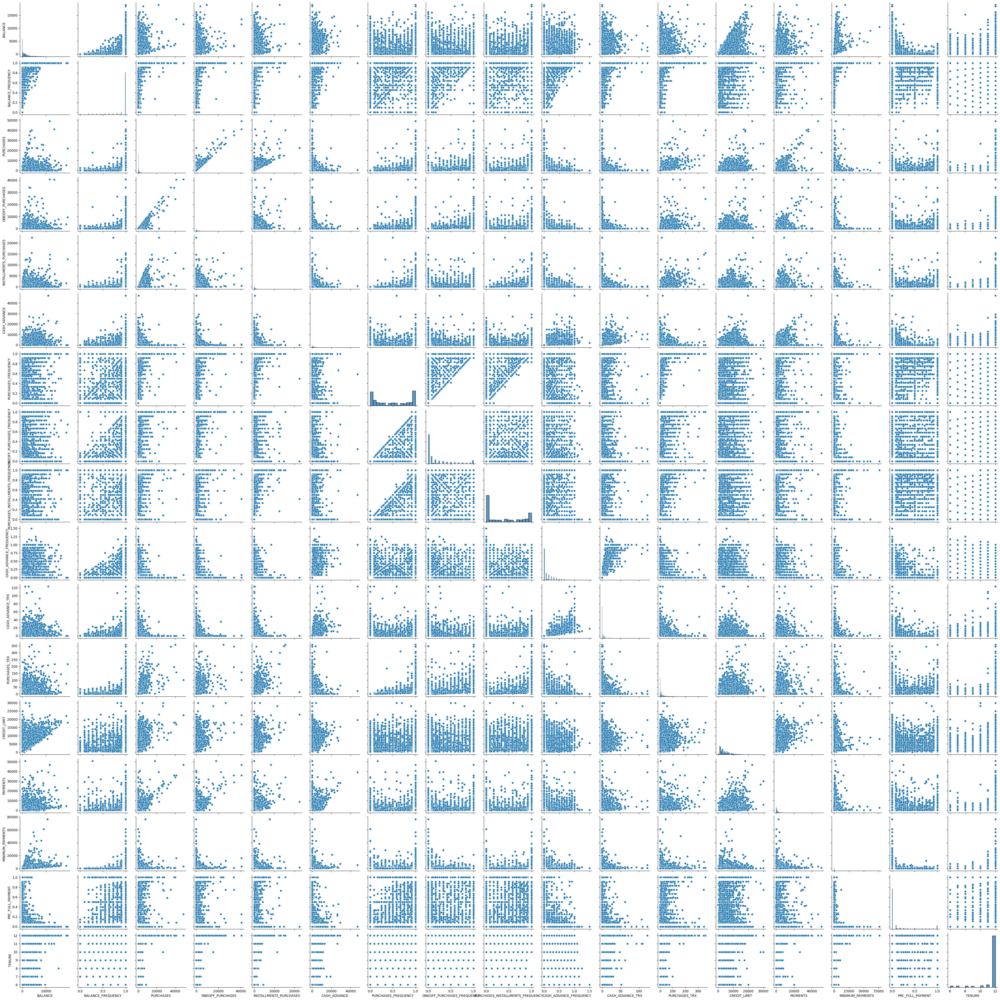

In [10]:
noID = df.drop(columns="CUST_ID")
sns.pairplot(noID)

Here we can see some pattern between some features, some are positively correlated, some are negatively correlated and some almost have no crolation.

<Axes: xlabel='BALANCE'>

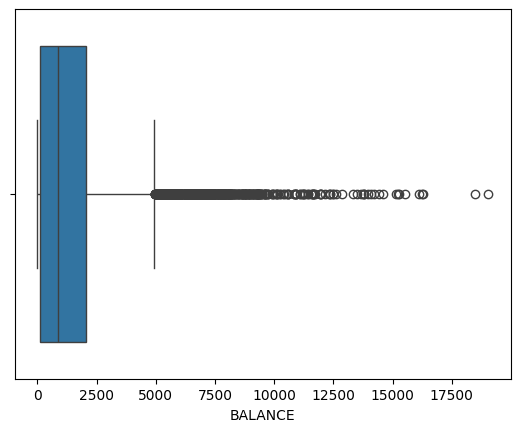

<Axes: xlabel='BALANCE_FREQUENCY'>

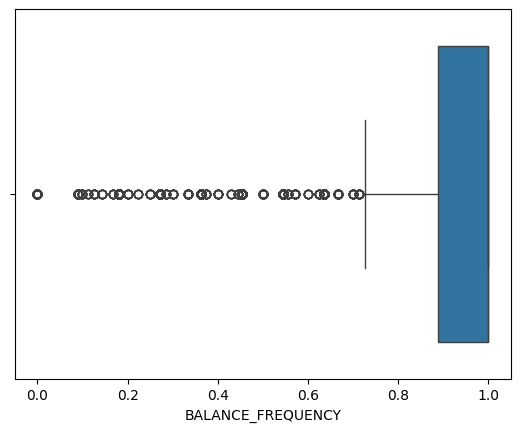

<Axes: xlabel='PURCHASES'>

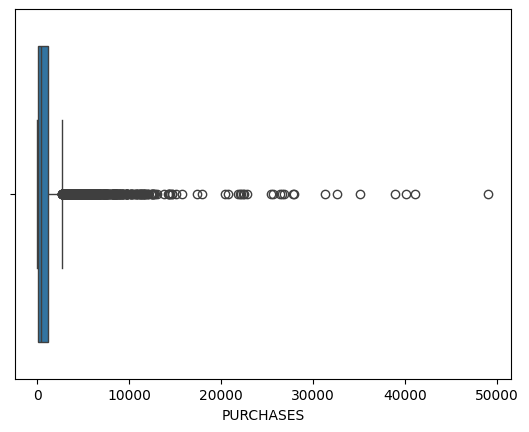

<Axes: xlabel='ONEOFF_PURCHASES'>

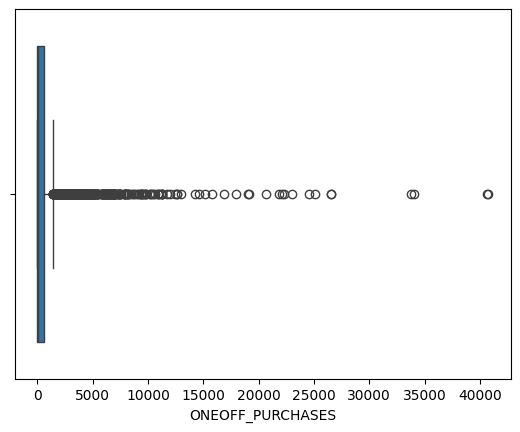

<Axes: xlabel='INSTALLMENTS_PURCHASES'>

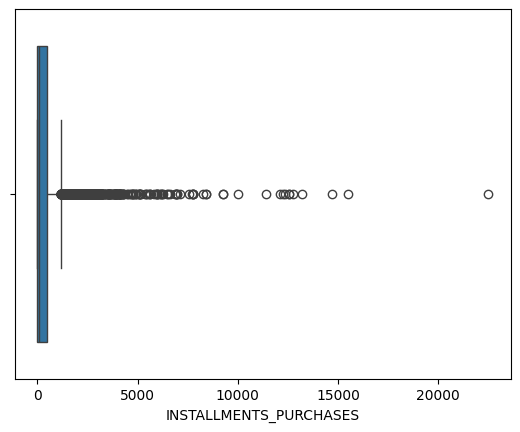

<Axes: xlabel='CASH_ADVANCE'>

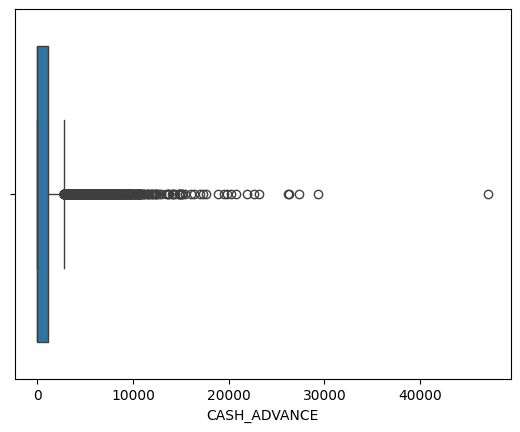

<Axes: xlabel='PURCHASES_FREQUENCY'>

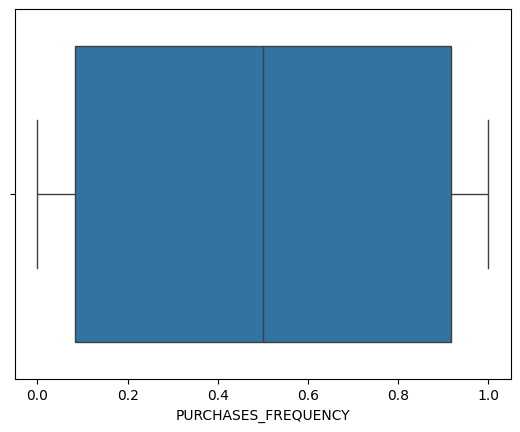

<Axes: xlabel='ONEOFF_PURCHASES_FREQUENCY'>

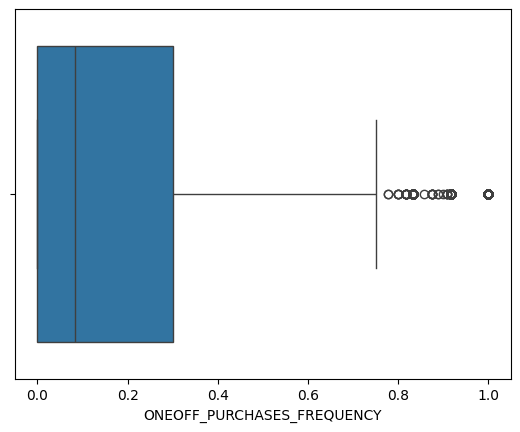

<Axes: xlabel='PURCHASES_INSTALLMENTS_FREQUENCY'>

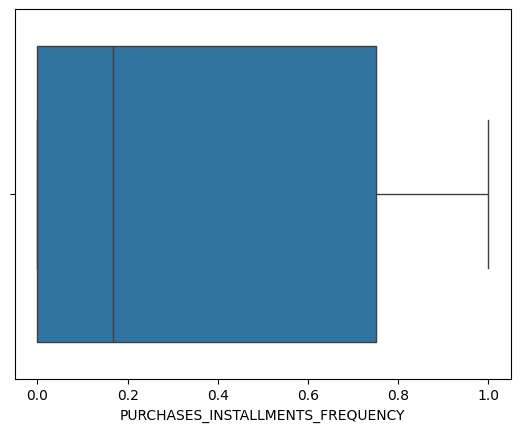

<Axes: xlabel='CASH_ADVANCE_FREQUENCY'>

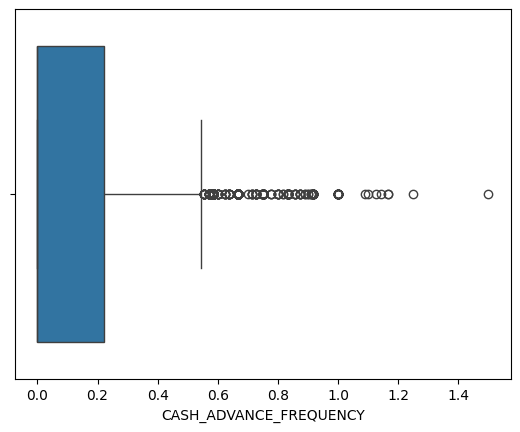

<Axes: xlabel='CASH_ADVANCE_TRX'>

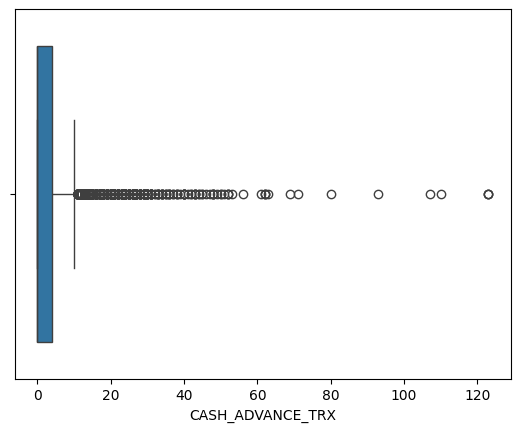

<Axes: xlabel='PURCHASES_TRX'>

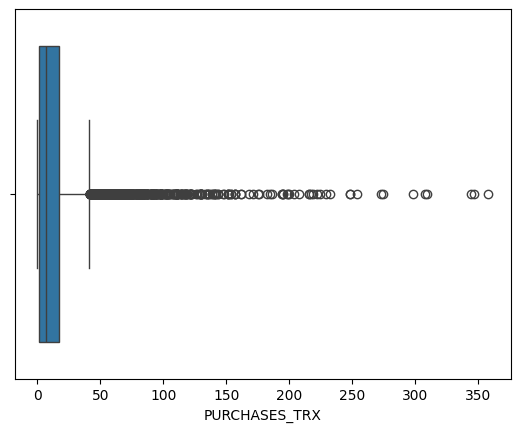

<Axes: xlabel='CREDIT_LIMIT'>

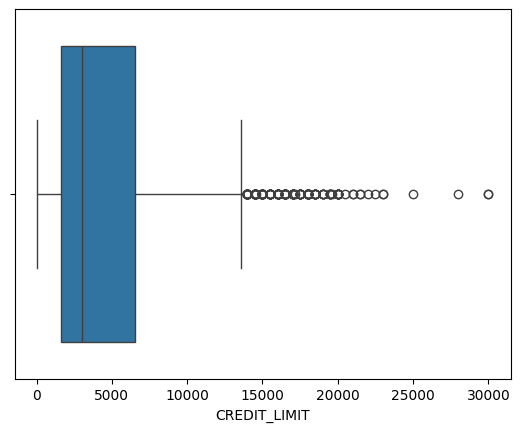

<Axes: xlabel='PAYMENTS'>

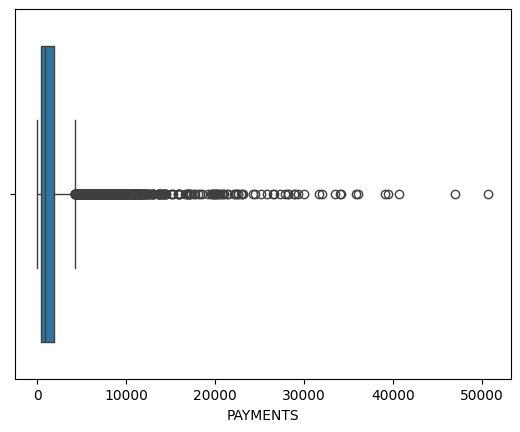

<Axes: xlabel='MINIMUM_PAYMENTS'>

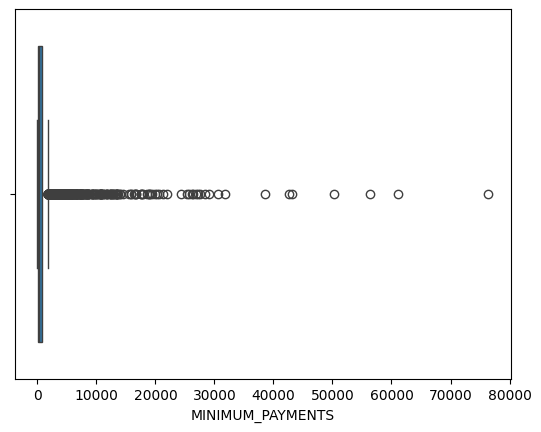

<Axes: xlabel='PRC_FULL_PAYMENT'>

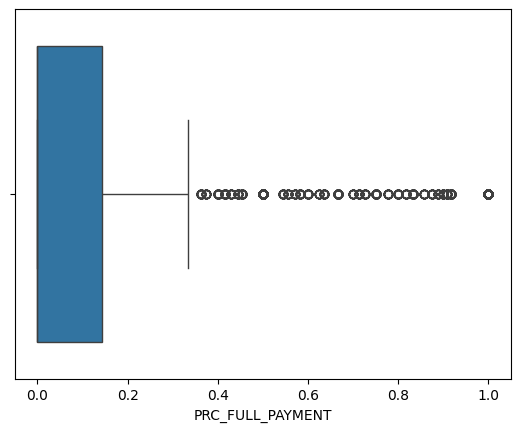

<Axes: xlabel='TENURE'>

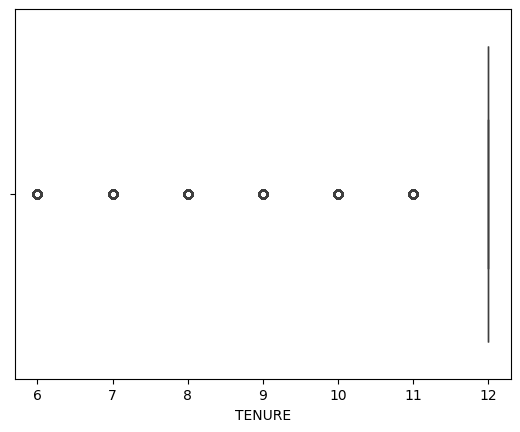

In [11]:
for X in noID.columns:
    sns.boxplot(x=df[X])
    plt.show()

almost all feuters are highly skewed.<br>
`CASH_ADVANCE_FREQUENCY` : A score (between 0 and 1) indicating how often cash advances are taken using the card.<br>
Some values are more than one I think we should applay thrathhold or drop them.<br>

In [ ]:
(df == 0).mean(axis=0)*100

CUST_ID                              0.000000
BALANCE                              0.893855
BALANCE_FREQUENCY                    0.893855
PURCHASES                           22.837989
ONEOFF_PURCHASES                    48.067039
INSTALLMENTS_PURCHASES              43.754190
CASH_ADVANCE                        51.709497
PURCHASES_FREQUENCY                 22.826816
ONEOFF_PURCHASES_FREQUENCY          48.067039
PURCHASES_INSTALLMENTS_FREQUENCY    43.743017
CASH_ADVANCE_FREQUENCY              51.709497
CASH_ADVANCE_TRX                    51.709497
PURCHASES_TRX                       22.837989
CREDIT_LIMIT                         0.000000
PAYMENTS                             2.681564
MINIMUM_PAYMENTS                     0.000000
PRC_FULL_PAYMENT                    65.955307
TENURE                               0.000000
dtype: float64

So many sparce features.

In [ ]:
df.columns


Index(['CUST_ID', 'BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES',
       'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
       'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
       'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
       'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS',
       'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE'],
      dtype='object')

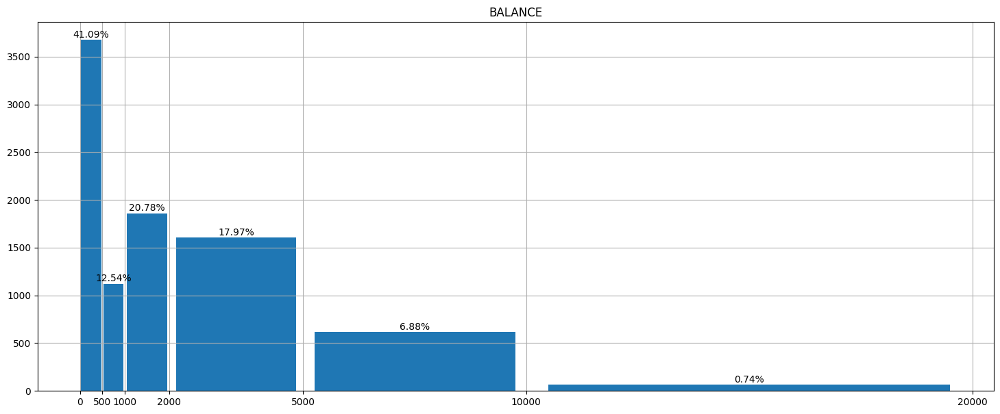

In [ ]:
Bar(df,"BALANCE",[0,500,1000,2000,5000,10000,20000])

More than 90% have less than 5K in their credit card balance.

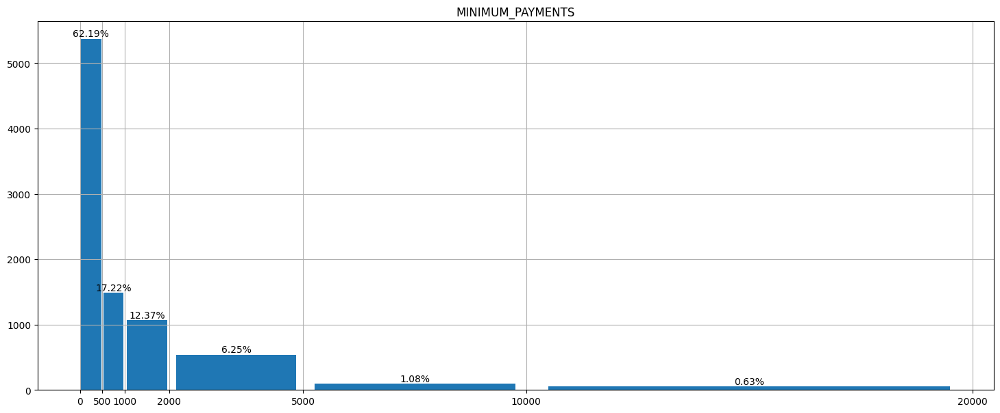

In [54]:
Bar(df,"MINIMUM_PAYMENTS",[0,500,1000,2000,5000,10000,20000])

`MINIMUM_PAYMENTS` ===> The minimum amount required to be paid each billing cycle to avoid late fees.<br>
Also more than 90% have less than 5K in minimum payments.<br>
This make sense because most data is left skewed.


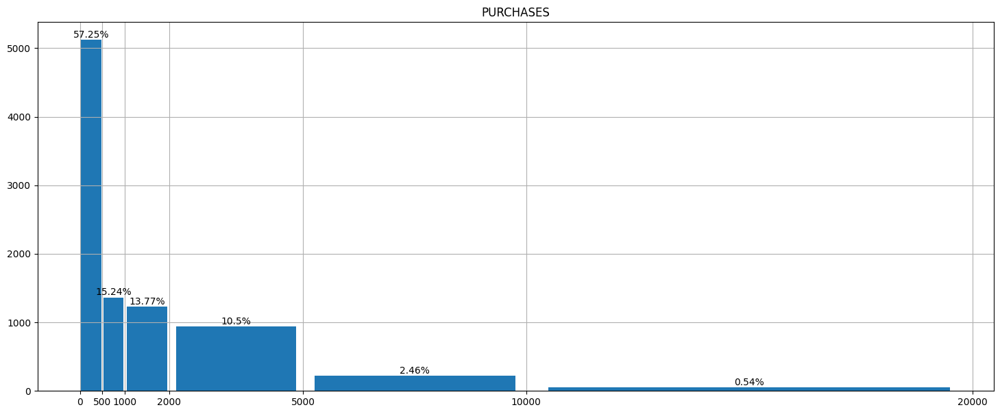

In [ ]:
Bar(df,"PURCHASES",[0,500,1000,2000,5000,10000,20000])


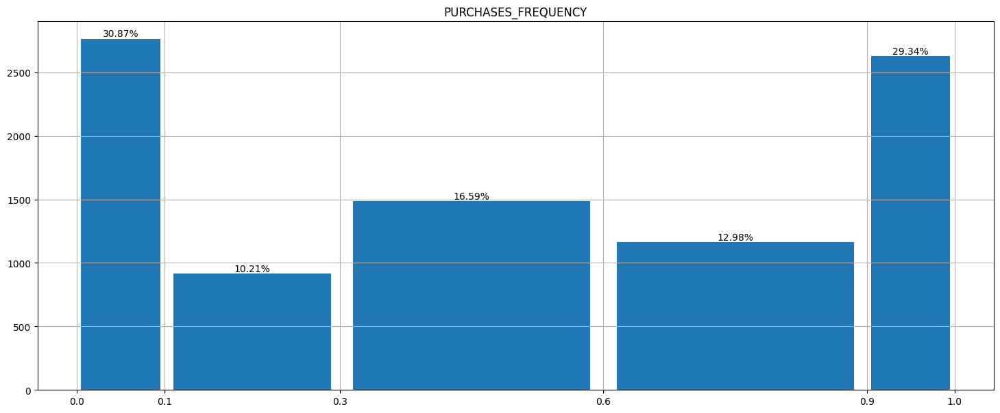

In [ ]:
Bar(df,"PURCHASES_FREQUENCY",[0,0.1,0.3,0.6,0.9,1])


`PURCHASES_FREQUENCY` is a score indicating how frequently purchases are made using the card. <br>
Looks like a 30% of the users are inactive (rarely using the card ).




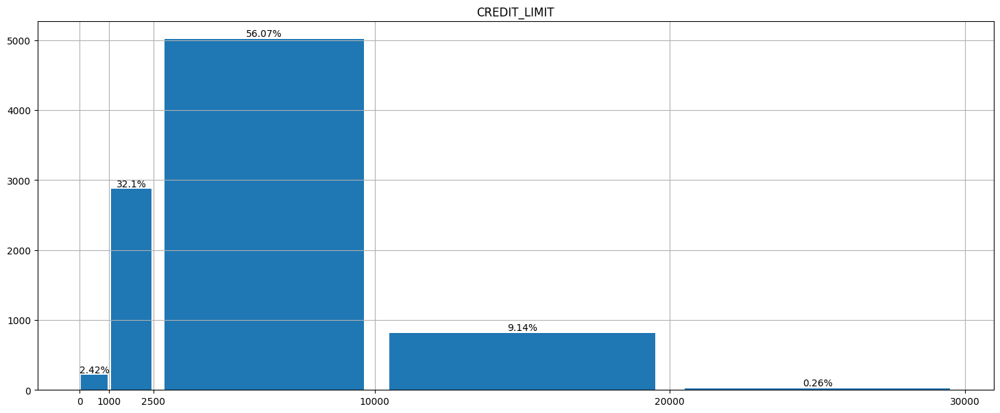

In [9]:
Bar(df,"CREDIT_LIMIT",[0,1000,2500,10000,20000,30000])


Almost 90% have credit limit bellow 10K

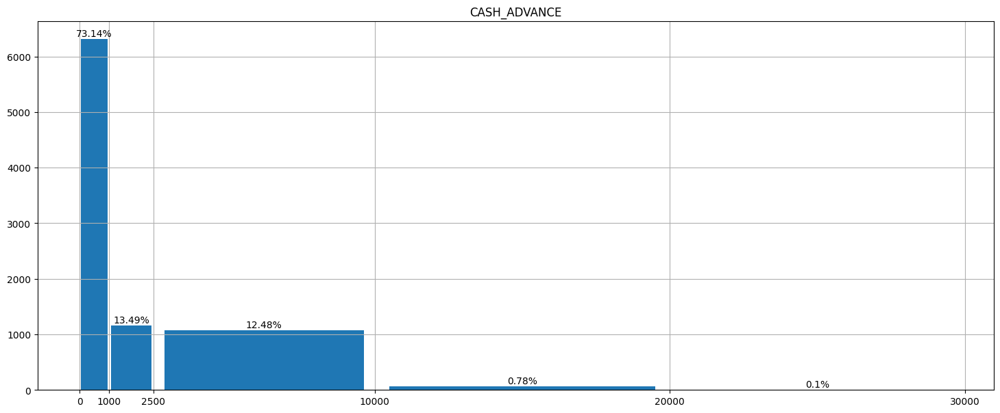

In [23]:
Bar(df,"CASH_ADVANCE",[0,1000,2500,10000,20000,30000])


data is Highly consentrated bellow 3K.

12    7584
11     365
10     236
6      204
8      196
7      190
9      175
Name: TENURE, dtype: int64

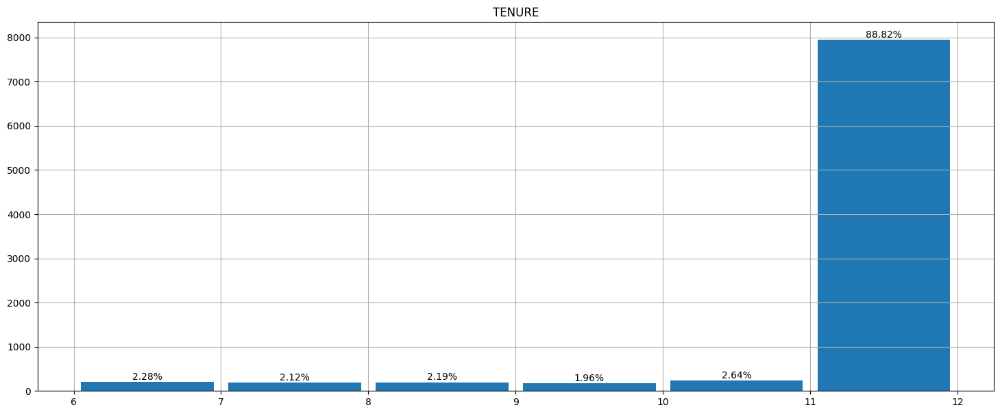

In [ ]:
Bar(df,"TENURE",[6,7,8,9,10,11,12])
df["TENURE"].value_counts()

`TENURE` ====> The length of time (in months) the customer has keept the credit card account.<br>
Almost all the users keept the card for 12 monthes or maybe more.

Reducing the number of dimensions down to two (or three) makes it possible to plot a high-dimensional training set on a graph and <br>
often gain some important insights by visually detecting patterns, such as clusters.

Let's tray to applay T-sne for this data before doing any data prossising and see the results.

In [6]:
#make a copy for the original dataset
df_copy=df.copy()
df_copy.drop(columns='CUST_ID',inplace=True)

<Axes: xlabel='0', ylabel='1'>

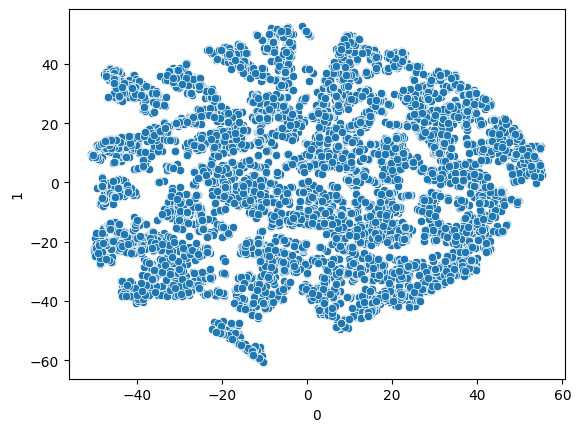

In [25]:
tsne = TSNE(random_state=42,n_components=2 , perplexity=42,learning_rate=50.5)
df_copy_tsne = tsne.fit_transform(df_copy)
tsne_as_df=pd.DataFrame(df_copy_tsne)
sns.scatterplot(x=tsne_as_df[0],y=tsne_as_df[1])

not a helpfull result.<br>
what about reducing the dimentions to 3D insted of 2D?

In [ ]:
tsne = TSNE(random_state=42,n_components=3 , perplexity=10)
df_copy_tsne = tsne.fit_transform(df_copy)
tsne_as_df=pd.DataFrame(df_copy_tsne)
# sns.pairplot(pd.DataFrame(df_copy_tsne))


Text(0.5, 0, 'X')

Text(0.5, 0.5, 'Y')

Text(0.5, 0, 'Z')

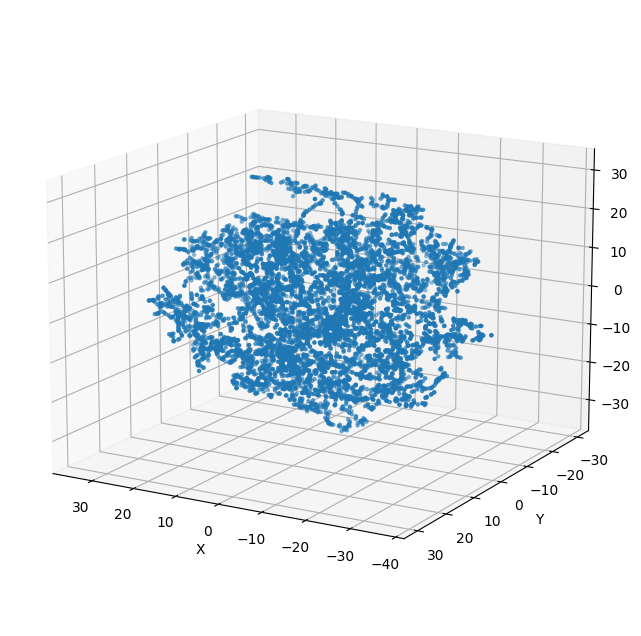

In [27]:
#from mpl_toolkits.mplot3d import Axes3D
tsne_as_df=pd.DataFrame(df_copy_tsne)
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(tsne_as_df[0], tsne_as_df[1], tsne_as_df[2],s=5)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.view_init( elev = 15,azim=120)

plt.show()

Running k-means on that to cluster our data will not be helpful.<br>
we should do some data preprocessing first.

## 3. <a name="3">Data preprocessing</a>
(<a href="#0">Go to top</a>)


### Define below all the issues that you had found in the previous part
1- one null value at `CREDIT_LIMIT`, and 313 null values at `MINIMUM_PAYMENTS`.           <br>
2- So many sparce and skueed features.           <br>
3- Droping `CUST_ID` Column.          <br>
4- Outlayers.     <br>

### for each issue adapt this methodology
- start by defining the solution
- apply this solution onn the data
- test the solution to make sure that you have solved the issue

**First issue**

Droppig null values and unnassesary culumns

In [6]:
#solution
df.drop('CUST_ID',axis=1, inplace=True)
df.dropna(axis = 0,inplace=True)


In [14]:
#test
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8636 entries, 0 to 8949
Data columns (total 17 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   BALANCE                           8636 non-null   float64
 1   BALANCE_FREQUENCY                 8636 non-null   float64
 2   PURCHASES                         8636 non-null   float64
 3   ONEOFF_PURCHASES                  8636 non-null   float64
 4   INSTALLMENTS_PURCHASES            8636 non-null   float64
 5   CASH_ADVANCE                      8636 non-null   float64
 6   PURCHASES_FREQUENCY               8636 non-null   float64
 7   ONEOFF_PURCHASES_FREQUENCY        8636 non-null   float64
 8   PURCHASES_INSTALLMENTS_FREQUENCY  8636 non-null   float64
 9   CASH_ADVANCE_FREQUENCY            8636 non-null   float64
 10  CASH_ADVANCE_TRX                  8636 non-null   int64  
 11  PURCHASES_TRX                     8636 non-null   int64  
 12  CREDIT

Handling data skewness and outer layers by applying log transformation.<br>
Trying MinMax scaler on (open limits features).

In [7]:
open_limits_features = ['BALANCE', 
                          'PURCHASES',
                          'ONEOFF_PURCHASES',
                          'INSTALLMENTS_PURCHASES',
                          'CASH_ADVANCE',  'CREDIT_LIMIT',
                          'PAYMENTS',
                          'MINIMUM_PAYMENTS',
                          'CASH_ADVANCE_TRX',
                          'PURCHASES_TRX'
                          ]
bounded_limits_features = ['BALANCE_FREQUENCY',
                      'PURCHASES_FREQUENCY', 
                      'ONEOFF_PURCHASES_FREQUENCY',
                      'PURCHASES_INSTALLMENTS_FREQUENCY',
                      'CASH_ADVANCE_FREQUENCY',
                      'PRC_FULL_PAYMENT',
                      'TENURE' ]

In [12]:
df_copy_Open = df_copy[open_limits_features]
min_max = MinMaxScaler(feature_range=(0,1))
scaled_data = min_max.fit_transform(df_copy_Open)
scaled_data = pd.DataFrame(scaled_data)
scaled_data.rename(columns={
    0: 'BALANCE',
    1: 'PURCHASES',
    2: 'ONEOFF_PURCHASES',
    3: 'INSTALLMENTS_PURCHASES',
    4: 'CASH_ADVANCE',
    5: 'CREDIT_LIMIT',
    6: 'PAYMENTS',
    7: 'MINIMUM_PAYMENTS',
    8: 'CASH_ADVANCE_TRX',
    9: 'PURCHASES_TRX'
}, inplace=True)
scaled_data[bounded_limits_features] = df_copy[bounded_limits_features]
scaled_data.head()



,BALANCE,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,CASH_ADVANCE_TRX,PURCHASES_TRX,BALANCE_FREQUENCY,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,PRC_FULL_PAYMENT,TENURE
0,0.002148,0.001945,0.000000,0.004240,0.000000,0.031720,0.003978,0.001826,0.00000,0.005587,0.818182,0.166667,0.000000,0.083333,0.00,0.000000,12.0
1,0.168169,0.000000,0.000000,0.000000,0.136685,0.232053,0.080892,0.014034,0.03252,0.000000,0.909091,0.000000,0.000000,0.000000,0.25,0.222222,12.0
2,0.131026,0.015766,0.018968,0.000000,0.000000,0.248748,0.012263,0.008210,0.00000,0.033520,1.000000,1.000000,1.000000,0.000000,0.00,0.000000,12.0
3,0.042940,0.000326,0.000393,0.000000,0.000000,0.038397,0.013373,0.003204,0.00000,0.002793,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.095038,0.027188,0.000000,0.059257,0.000000,0.058431,0.027602,0.031506,0.00000,0.022346,1.000000,0.083333,0.083333,0.000000,0.00,0.000000,12.0


<Axes: xlabel='0', ylabel='1'>

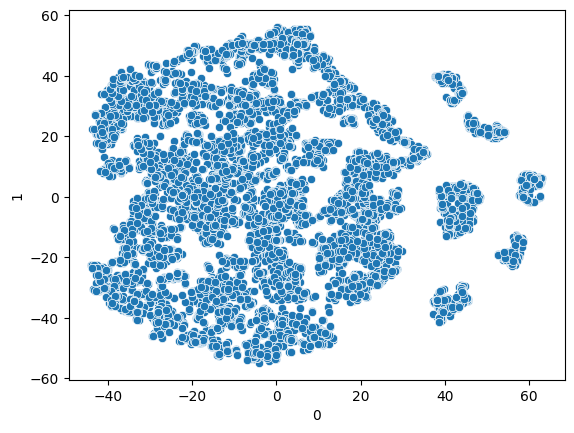

In [55]:
tsne = TSNE(random_state=42,n_components=2 , perplexity=42,learning_rate=50.5)
df_copy_tsne = tsne.fit_transform(scaled_data)
tsne_as_df=pd.DataFrame(df_copy_tsne)
sns.scatterplot(x=tsne_as_df[0],y=tsne_as_df[1])

Still not good, let's try a different transformation method.

the log function is equipped to deal with large numbers. so we will applay it to the coulomns with large and small numbers (open limits features).

In [9]:
#solution
log_scaled_data = np.log1p(df[open_limits_features])
log_scaled_data[bounded_limits_features] = df[bounded_limits_features]
log_scaled_data.head()

,BALANCE,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,CASH_ADVANCE_TRX,PURCHASES_TRX,BALANCE_FREQUENCY,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,PRC_FULL_PAYMENT,TENURE
0,3.735304,4.568506,0.000000,4.568506,0.000000,6.908755,5.312231,4.945277,0.000000,1.098612,0.818182,0.166667,0.000000,0.083333,0.00,0.000000,12
1,8.071989,0.000000,0.000000,0.000000,8.770896,8.853808,8.319725,6.978531,1.609438,0.000000,0.909091,0.000000,0.000000,0.000000,0.25,0.222222,12
2,7.822504,6.651791,6.651791,0.000000,0.000000,8.922792,6.434654,6.442994,0.000000,2.564949,1.000000,1.000000,1.000000,0.000000,0.00,0.000000,12
4,6.707735,2.833213,2.833213,0.000000,0.000000,7.090910,6.521114,5.504483,0.000000,0.693147,1.000000,0.083333,0.083333,0.000000,0.00,0.000000,12
5,7.501540,7.196147,0.000000,7.196147,0.000000,7.496097,7.244983,7.786654,0.000000,2.197225,1.000000,0.666667,0.000000,0.583333,0.00,0.000000,12


In [22]:
#test
log_scaled_data.describe().T

,count,mean,std,min,25%,50%,75%,max
BALANCE,8636.0,6.265737,1.895982,0.000000,5.004584,6.822040,7.652639,9.854515
PURCHASES,8636.0,4.928905,2.922819,0.000000,3.792507,5.930666,7.044888,10.800403
ONEOFF_PURCHASES,8636.0,3.239500,3.252619,0.000000,0.000000,3.828533,6.397096,10.615512
INSTALLMENTS_PURCHASES,8636.0,3.387883,3.091009,0.000000,0.000000,4.562106,6.184453,10.021315
CASH_ADVANCE,8636.0,3.349135,3.571114,0.000000,0.000000,0.000000,7.032964,10.760839
CREDIT_LIMIT,8636.0,8.099572,0.822341,3.931826,7.378384,8.006701,8.779711,10.308986
PAYMENTS,8636.0,6.814890,1.159994,0.048326,6.039205,6.799809,7.576683,10.834125
MINIMUM_PAYMENTS,8636.0,5.922564,1.190068,0.018982,5.136760,5.747647,6.717196,11.243832
CASH_ADVANCE_TRX,8636.0,0.829327,1.015146,0.000000,0.000000,0.000000,1.609438,4.820282
PURCHASES_TRX,8636.0,1.916439,1.378707,0.000000,0.693147,2.079442,2.944439,5.883322


Let's tray to applay T-sne to the log transformed data.

<Axes: xlabel='0', ylabel='1'>

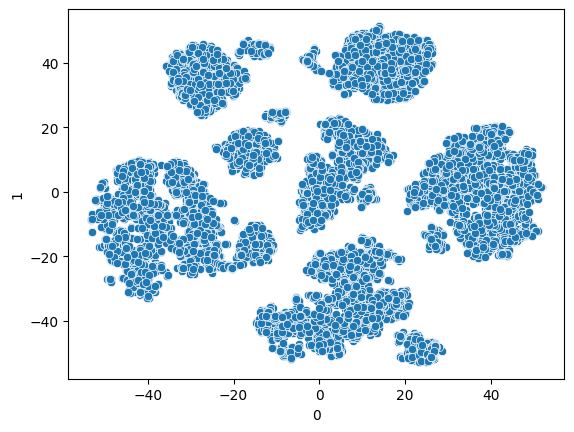

In [59]:
tsne = TSNE(random_state=42,n_components=2 , perplexity=42,learning_rate=50.5)
df_copy_tsne = tsne.fit_transform(log_scaled_data)
tsne_as_df=pd.DataFrame(df_copy_tsne)
sns.scatterplot(x=tsne_as_df[0],y=tsne_as_df[1])

Amazing !! <br>
by looking at the picture I think T-sne suggests a 7 groupes.<br>
we can also use elbow curve to make shure ( latter ).<br>

# PCA Vs. Kernal PCA

In [54]:
pca = PCA(n_components=.95) # save 95% of the fuetures
kernel_pca = KernelPCA(n_components = 15,
    kernel="rbf", gamma=10, fit_inverse_transform=True, alpha=0.1
)
Data_pca = pca.fit_transform(log_scaled_data)
Data_kernel_pca = kernel_pca.fit_transform(log_scaled_data)


In [55]:
Data_kernel_pca.shape
Data_pca.shape
Data_pca = pd.DataFrame(Data_pca)
Data_kernel_pca = pd.DataFrame(Data_kernel_pca)

(8636, 15)

(8636, 6)

Applaying T-sne on linear PCA.

<Axes: xlabel='0', ylabel='1'>

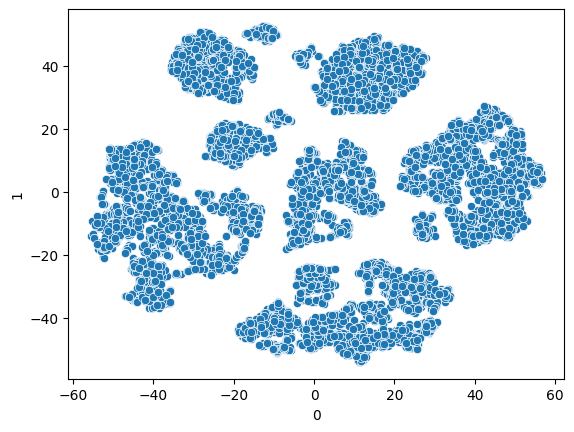

In [89]:
tsne = TSNE(random_state=42,n_components=2 , perplexity=42,learning_rate=50.5)
df_copy_tsne = tsne.fit_transform(Data_pca)
tsne_as_df_PCA=pd.DataFrame(df_copy_tsne)
sns.scatterplot(x=tsne_as_df_PCA[0],y=tsne_as_df_PCA[1])

It looks like PCA performed well in this data.<br>
and visualy it seems that T-sne suggests 7 clusters.

Applaying T-sne on kernel PCA.

<Axes: xlabel='0', ylabel='1'>

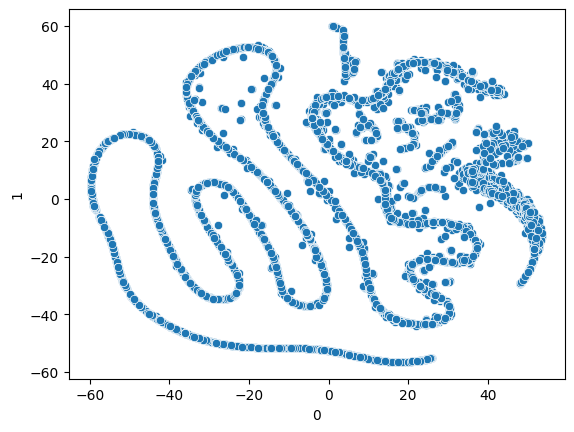

In [56]:
tsne = TSNE(random_state=42,n_components=2 , perplexity=42,learning_rate=50.5)
df_copy_tsne = tsne.fit_transform(Data_kernel_pca)
tsne_as_df=pd.DataFrame(df_copy_tsne)
sns.scatterplot(x=tsne_as_df[0],y=tsne_as_df[1])

It looks like the kernel PCA has some sort of hummer. 😅<br>
Let's tray the default parameters with ‘sigmoid’.

In [36]:
kernel_pca = KernelPCA(n_components = 16,kernel="sigmoid")
Data_kernel_pca = kernel_pca.fit_transform(log_scaled_data)

<Axes: xlabel='0', ylabel='1'>

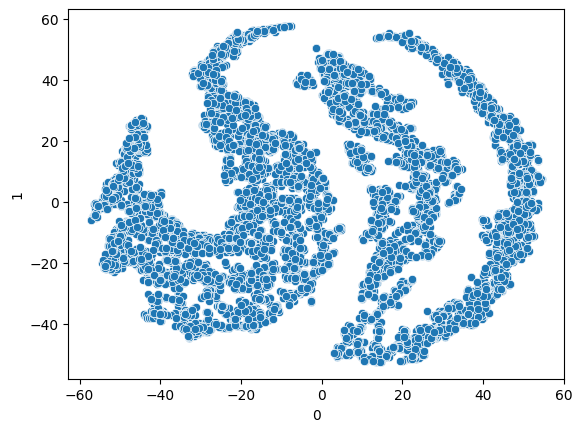

In [37]:
tsne = TSNE(random_state=42,n_components=2 , perplexity=42,learning_rate=50.5)
df_copy_tsne = tsne.fit_transform(Data_kernel_pca)
tsne_as_df=pd.DataFrame(df_copy_tsne)
sns.scatterplot(x=tsne_as_df[0],y=tsne_as_df[1])

stell not good, let's see `poly`

<Axes: xlabel='0', ylabel='1'>

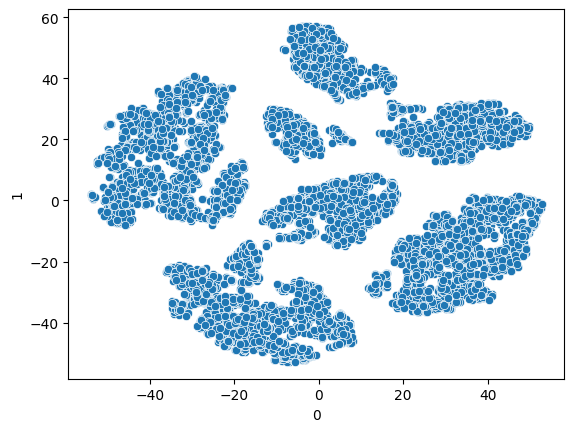

In [88]:
kernel_pca = KernelPCA(n_components = 16,kernel="poly")
Data_kernel_pca = kernel_pca.fit_transform(log_scaled_data)

tsne = TSNE(random_state=42,n_components=2 , perplexity=42,learning_rate=50.5)
df_copy_tsne = tsne.fit_transform(Data_kernel_pca)
tsne_as_df_Kernel_PCA=pd.DataFrame(df_copy_tsne)
sns.scatterplot(x=tsne_as_df_Kernel_PCA[0],y=tsne_as_df_Kernel_PCA[1])


Amazing!!

# DBSCAN

In [131]:
dbscan = DBSCAN(eps=2.6, min_samples=5)
dbscan_clusters = dbscan.fit(log_scaled_data)

In [132]:
pd.DataFrame(dbscan_clusters.labels_).value_counts()

 0    4405
 1    1959
 2    1415
 3     749
-1     108
dtype: int64

<Axes: xlabel='0', ylabel='1'>

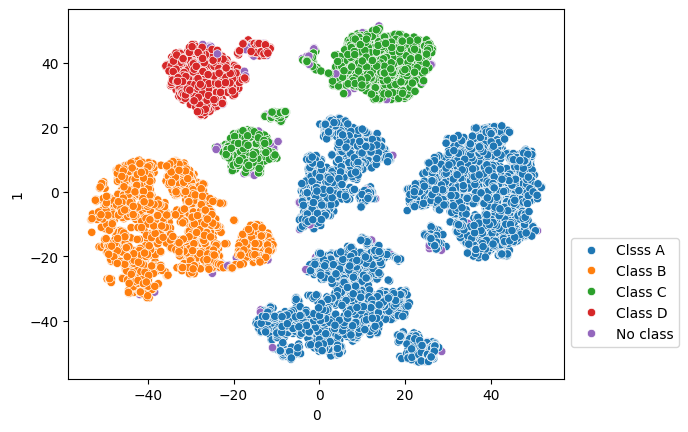

In [136]:
names = {-1: 'No class',
         0: 'Clsss A', 
         1: 'Class B', 
         2: 'Class C', 
         3: 'Class D', 
}

# Replace cluster labels with names
cluster_labels = [names[label] for label in dbscan_clusters.labels_]

# Scatter plot
sns.scatterplot(x=tsne_as_df[0], y=tsne_as_df[1], hue=cluster_labels)
plt.legend(loc='upper left', bbox_to_anchor=(1, 0.4))
plt.show()

*What is the feature scaling technique that would use and why?* <br>
*return to this section again and try another technique and see how that will impact your result*<br>
for more details on different methods for scaling check these links
- https://scikit-learn.org/stable/modules/preprocessing.html#preprocessing
- https://scikit-learn.org/stable/modules/classes.html#module-sklearn.preprocessing
- https://www.analyticsvidhya.com/blog/2020/07/types-of-feature-transformation-and-scaling/

Answer here:

{'icoord': [[15.0, 15.0, 25.0, 25.0],
  [5.0, 5.0, 20.0, 20.0],
  [45.0, 45.0, 55.0, 55.0],
  [35.0, 35.0, 50.0, 50.0],
  [75.0, 75.0, 85.0, 85.0],
  [65.0, 65.0, 80.0, 80.0],
  [95.0, 95.0, 105.0, 105.0],
  [125.0, 125.0, 135.0, 135.0],
  [115.0, 115.0, 130.0, 130.0],
  [100.0, 100.0, 122.5, 122.5],
  [72.5, 72.5, 111.25, 111.25],
  [42.5, 42.5, 91.875, 91.875],
  [12.5, 12.5, 67.1875, 67.1875],
  [155.0, 155.0, 165.0, 165.0],
  [175.0, 175.0, 185.0, 185.0],
  [160.0, 160.0, 180.0, 180.0],
  [145.0, 145.0, 170.0, 170.0],
  [225.0, 225.0, 235.0, 235.0],
  [215.0, 215.0, 230.0, 230.0],
  [205.0, 205.0, 222.5, 222.5],
  [195.0, 195.0, 213.75, 213.75],
  [157.5, 157.5, 204.375, 204.375],
  [245.0, 245.0, 255.0, 255.0],
  [265.0, 265.0, 275.0, 275.0],
  [250.0, 250.0, 270.0, 270.0],
  [295.0, 295.0, 305.0, 305.0],
  [285.0, 285.0, 300.0, 300.0],
  [325.0, 325.0, 335.0, 335.0],
  [355.0, 355.0, 365.0, 365.0],
  [345.0, 345.0, 360.0, 360.0],
  [330.0, 330.0, 352.5, 352.5],
  [315.0, 315.0, 3

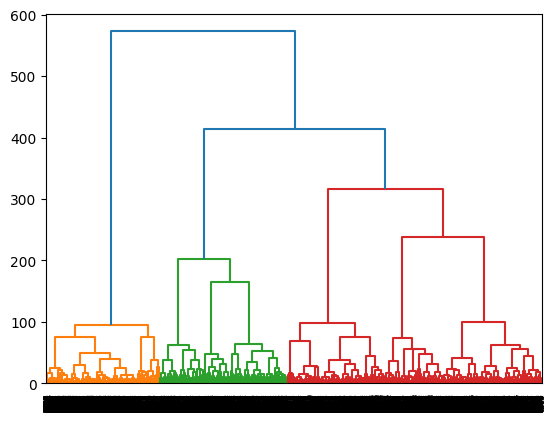

In [139]:
from scipy.cluster.hierarchy import dendrogram, ward, single

link_mat = ward(log_scaled_data)
dendrogram(link_mat)
plt.show()


hierarchy clasters also shows 7 clasters.

## 5. <a name="5">K Means</a>
(<a href="#5">Go to top</a>)

1- Use the k means class that you implemented in the previous task to cluster this data
2- Use http://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html and see if the difference in the result
3- Use elbow method to determine the K (plot the result using two plot one for distorion and another for inertia)
4- (Optionally) make a method that pick the best number of clusters for you
5- Using different techniques for scaling and comment on the result

In [10]:
inertias = []
k_range = range(3, 16)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(log_scaled_data)
    inertias.append(kmeans.inertia_)

KMeans(n_clusters=3, random_state=42)

KMeans(n_clusters=4, random_state=42)

KMeans(n_clusters=5, random_state=42)

KMeans(n_clusters=6, random_state=42)

KMeans(n_clusters=7, random_state=42)

KMeans(random_state=42)

KMeans(n_clusters=9, random_state=42)

KMeans(n_clusters=10, random_state=42)

KMeans(n_clusters=11, random_state=42)

KMeans(n_clusters=12, random_state=42)

KMeans(n_clusters=13, random_state=42)

KMeans(n_clusters=14, random_state=42)

KMeans(n_clusters=15, random_state=42)

Text(0.5, 0, 'Number of Clusters (K)')

Text(0, 0.5, 'Inertia')

Text(0.5, 1.0, 'Elbow Method for Optimal K (Inertia)')

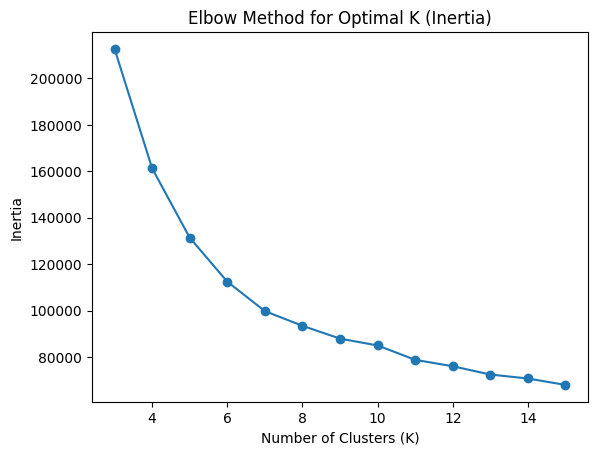

In [83]:
# Plot Inertia
plt.plot(k_range, inertias, marker='o')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal K (Inertia)')
plt.show()


according to elbow plot we chose 7 clusters.

In [11]:
kmeans = KMeans(n_clusters=7, random_state=0).fit(log_scaled_data)

# !!! `Driving business insights part was moved to the end of the notebook` !!!


<Axes: xlabel='0', ylabel='1'>

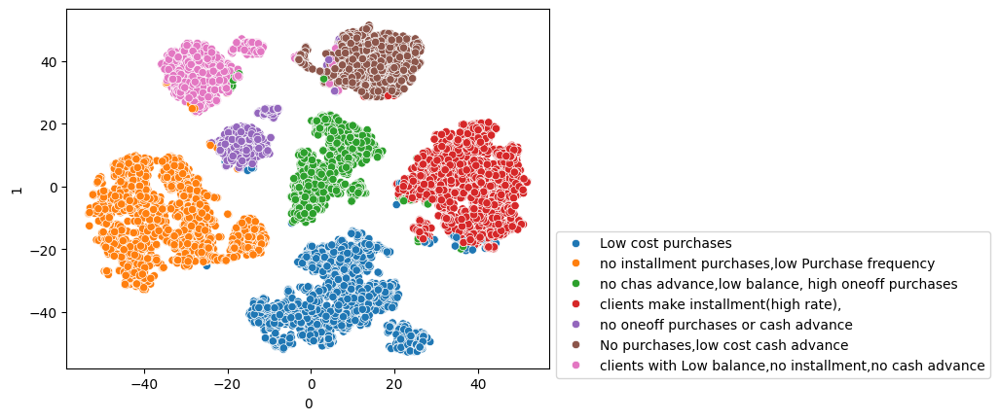

In [85]:
names = {0: 'Low cost purchases', 
         1: 'no installment purchases,low Purchase frequency', 
         2: 'no chas advance,low balance, high oneoff purchases', 
         3: 'No purchases,low cost cash advance', 
         4: 'no oneoff purchases or cash advance',
         5:'clients make installment(high rate),',
         6:'clients with Low balance,no installment,no cash advance'}

# Replace cluster labels with names
cluster_labels = [names[label] for label in kmeans.labels_]

# Scatter plot
sns.scatterplot(x=tsne_as_df[0], y=tsne_as_df[1], hue=cluster_labels)
plt.legend(loc='upper left', bbox_to_anchor=(1, 0.4))
plt.show()

<Axes: xlabel='0', ylabel='1'>

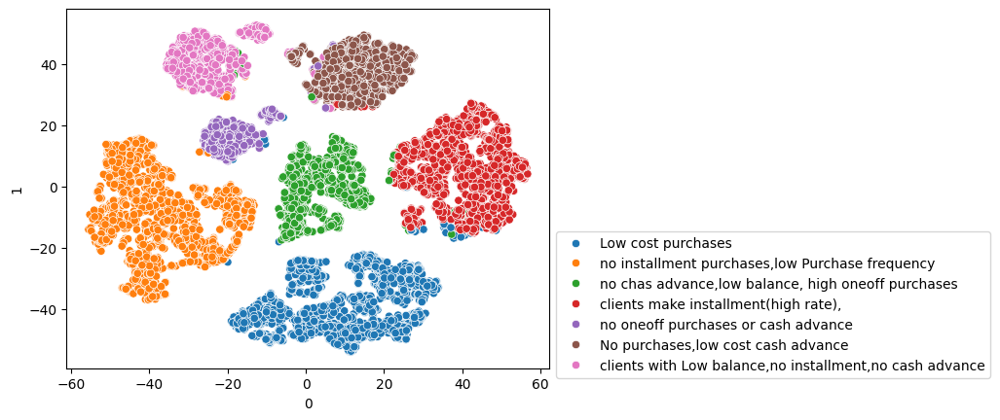

In [91]:
# Scatter plot for PCA.
sns.scatterplot(x=tsne_as_df_PCA[0], y=tsne_as_df_PCA[1], hue=cluster_labels)
plt.legend(loc='upper left', bbox_to_anchor=(1, 0.4))
plt.show()

<Axes: xlabel='0', ylabel='1'>

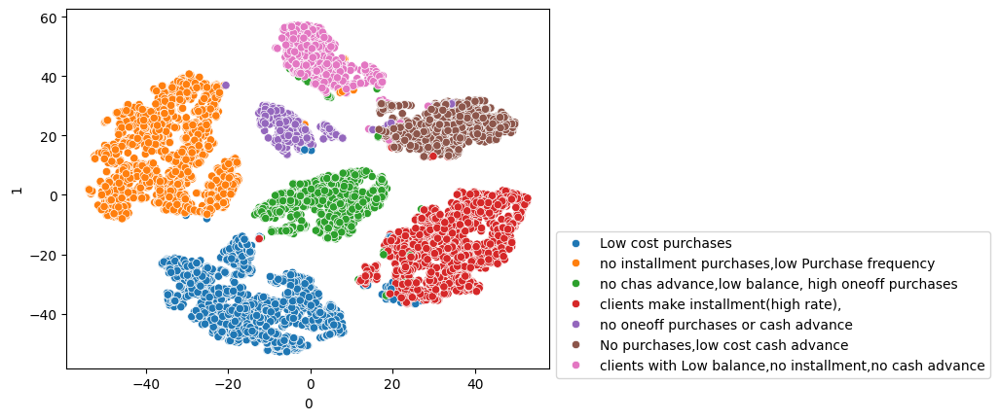

In [92]:
# Scatter plot for kernal PCA.
sns.scatterplot(x=tsne_as_df_Kernel_PCA[0], y=tsne_as_df_Kernel_PCA[1], hue=cluster_labels)
plt.legend(loc='upper left', bbox_to_anchor=(1, 0.4))
plt.show()

3D T-sne

In [94]:
tsne = TSNE(random_state=42,n_components=3 , perplexity=10)
df_copy_tsne_3D = tsne.fit_transform(log_scaled_data)
df_copy_tsne_3D=pd.DataFrame(df_copy_tsne_3D)

Text(0.5, 0, 'X')

Text(0.5, 0.5, 'Y')

Text(0.5, 0, 'Z')

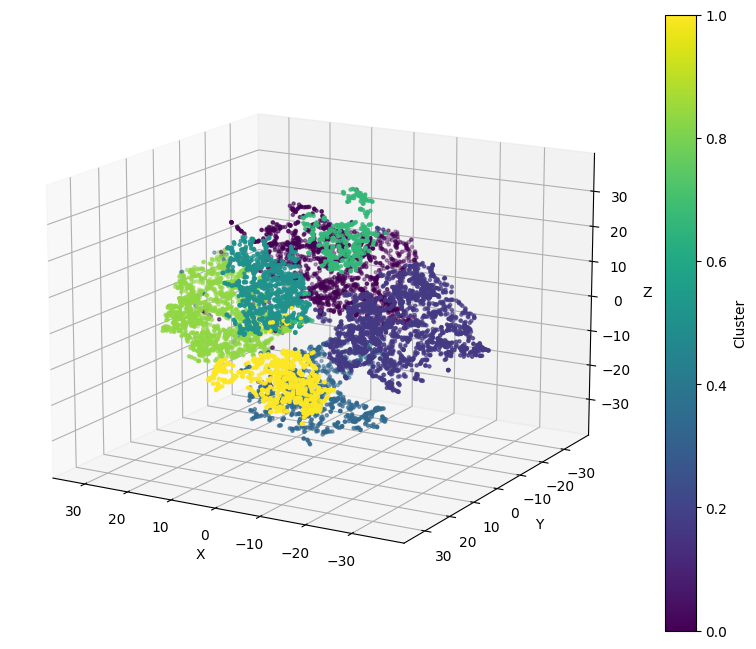

In [97]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Assuming kmeans.labels_ contains the cluster labels for each point
ax.scatter(df_copy_tsne_3D[0], df_copy_tsne_3D[1], df_copy_tsne_3D[2], c=kmeans.labels_, s=5, cmap='viridis')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.view_init(elev=15, azim=120)

# Add color bar
cbar = plt.colorbar(ax.scatter([], [], [], c=[], cmap='viridis'), ax=ax)
cbar.set_label('Cluster')

plt.show()


Text(0.5, 0, 'X')

Text(0.5, 0.5, 'Y')

Text(0.5, 0, 'Z')

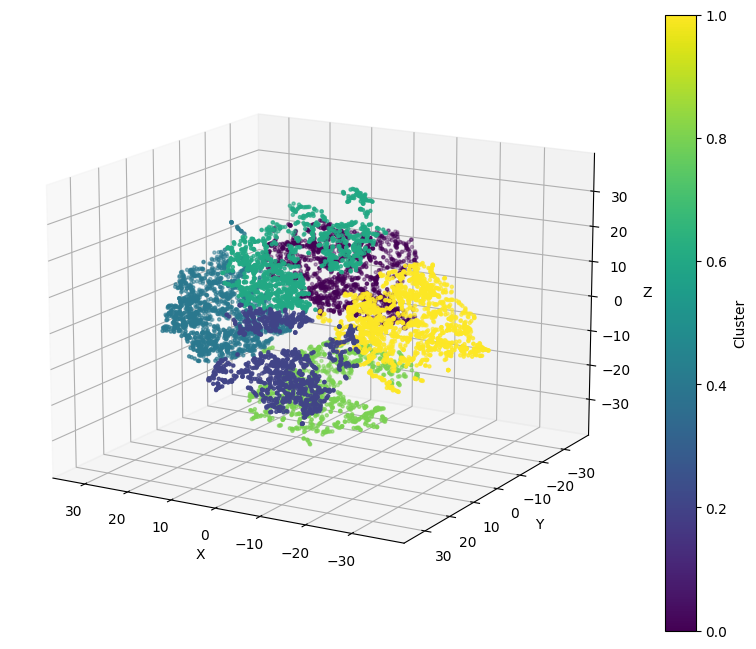

In [24]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Assuming kmeans.labels_ contains the cluster labels for each point
ax.scatter(tsne_as_df[0], tsne_as_df[1], tsne_as_df[2], c=kmeans.labels_, s=5, cmap='viridis')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.view_init(elev=15, azim=120)

# Add color bar
cbar = plt.colorbar(ax.scatter([], [], [], c=[], cmap='viridis'), ax=ax)
cbar.set_label('Cluster')

plt.show()


## 6. <a name="5">Training and hyperparamter tuning</a>
(<a href="#0">Go to top</a>)


Before we start the training process we need to specify 3 paramters:<br>
1- Linkage criteria : The linkage criterion determines the distance between two clusters
    - Complete-Linkage Clustering
    - Single-Linkage Clustering
    - Average-Linkage Clustering
    - Centroid Linkage Clustering
2- Distance function:
    - Euclidean Distance
    - Manhattan Distance
    - Mahalanobis distance
3- Number of clusters


### *Number of clusters*
Use Dendograms to specify the optimum number of clusters
- Compare how changing linkage criteria or distance function would affect the optimum number of clusters
- you can use silhouette_score or any other evalution method to help you determine the optimum number of clusters
https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html

In [ ]:
import scipy.cluster.hierarchy as shc

plt.figure(figsize=(10, 7))
plt.title("Counters Dendograms")
dend = shc.dendrogram(shc.linkage(y=... , method=...,metric=...),orientation='right') #fill y with your dataframe
                                                                                      #and method with linkage criteria
                                                                                      #and metric with distance function

In [ ]:
#training
from sklearn.cluster import AgglomerativeClustering


## 6. <a name="6">improvement ideas</a>
(<a href="#0">Go to top</a>)

- Try to use PCA to reduce the number of features and compare how this will affect the clustring process
- Try to run your code again but with different tranformation technique
- Implement gap statistics method and use it as evaluation metric and compare the result with what you did before https://www.datanovia.com/en/lessons/determining-the-optimal-number-of-clusters-3-must-know-methods/#gap-statistic-method

# Driving busness mening


In [ ]:
log_scaled_data_copy = log_scaled_data.copy()
log_scaled_data_copy["labols"] = pd.DataFrame(kmeans.labels_)
log_scaled_data_copy.dropna(axis = 0,inplace=True)

In [ ]:
unique_labels = log_scaled_data_copy['labols'].unique()

# Create a dictionary to store DataFrames for each group
group_dataframes = {}

# Iterate over unique labels and create a DataFrame for each group
for label in unique_labels:
    group_dataframes[label] = log_scaled_data_copy[log_scaled_data_copy['labols'] == label].copy()

In [110]:
def Bar_subplots(dfs, Column_name, bins,ii):
    """Plot a meaningful bar plot.

    Args:
        df (Pandas Dataframe): DataFrame with all the records.
        Column_name (string): the name of the column we want to plot.
        bins (list): Dividing our bar plot according to those bins.
    """
    fig, axes = plt.subplots(1, 2, figsize=(18, 7))  # Create subplots for each class
    for i in range(2):
        df = dfs[i]
        freq, bins, p = axes[i].hist(df[Column_name], bins=bins, rwidth=0.9)


        # x coordinate for labels
        bin_centers = np.diff(bins) * 0.5 + bins[:-1]

        n = 0
        for fr, x, patch in zip(freq, bin_centers, p):
            height = int(freq[n])
            axes[i].annotate("{}%".format(round(height * 100 / df.shape[0], 2)),
                             xy=(x, height),
                             xytext=(0, 0.2),
                             textcoords="offset points",
                             ha='center', va='bottom'
                             )
            n = n + 1
        axes[i].grid()
        axes[i].set_xticks(bins)
        axes[i].set_title("CLASS " + str(i+ii))
        axes[i].set_xlabel(Column_name)
    plt.tight_layout()
    plt.show()

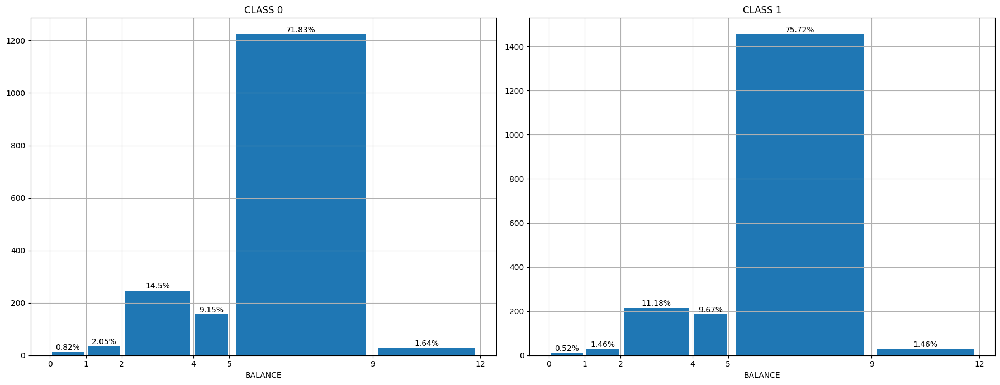

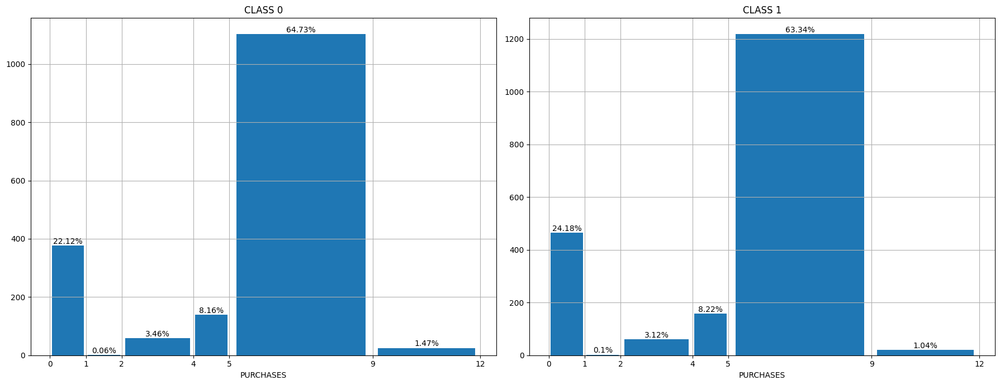

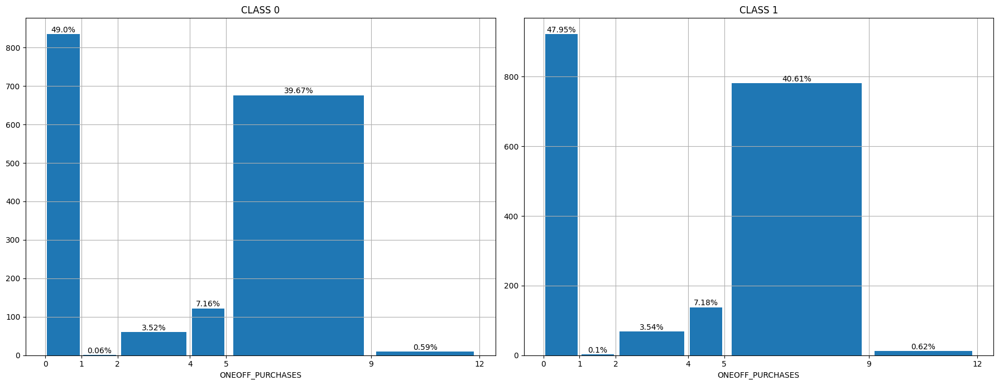

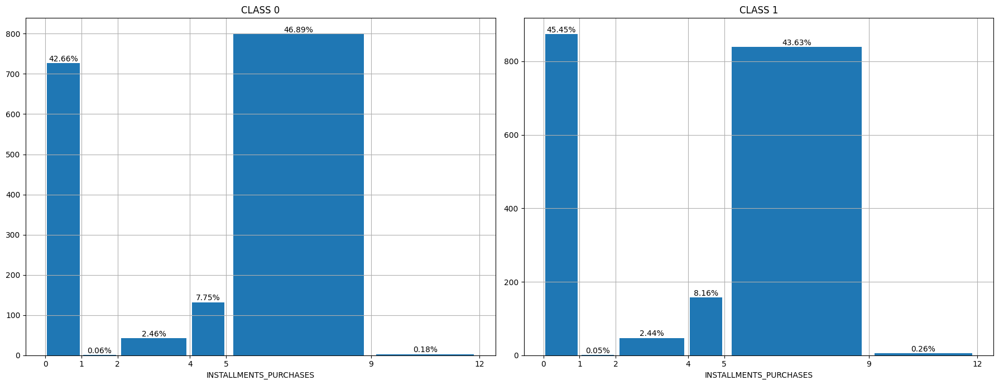

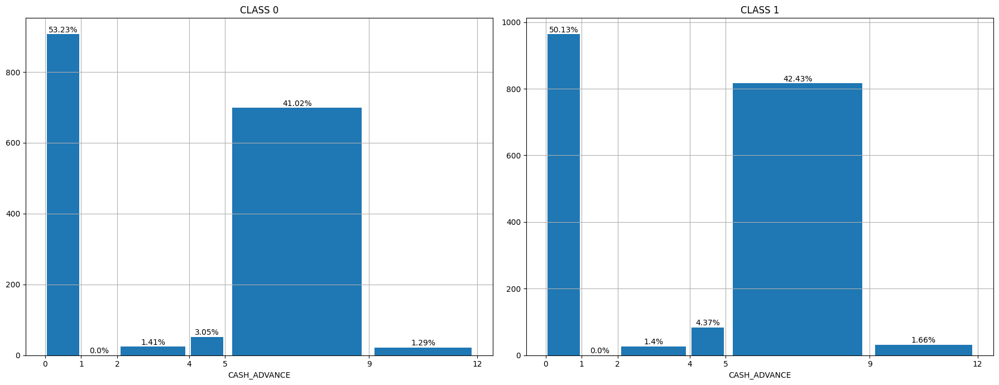

...

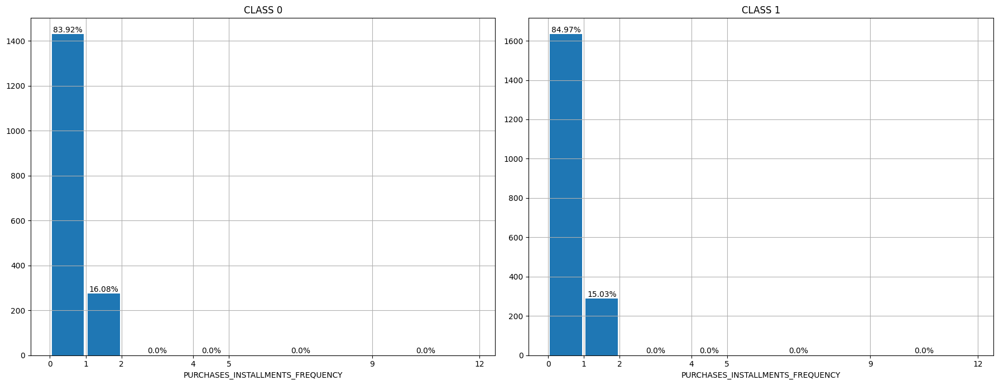

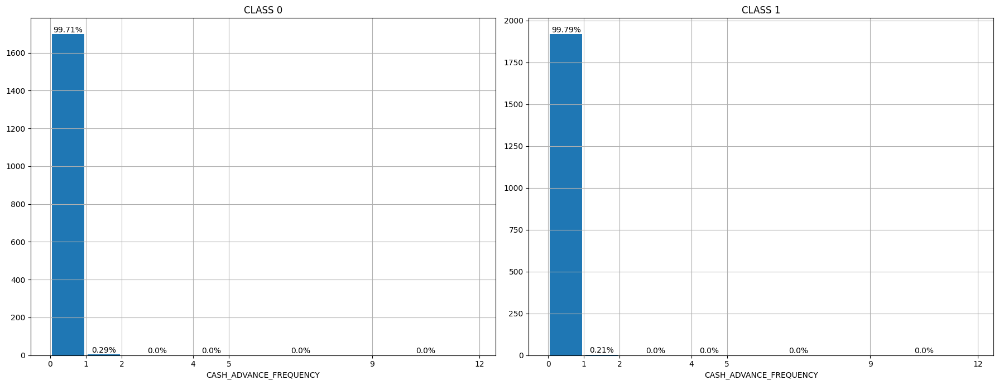

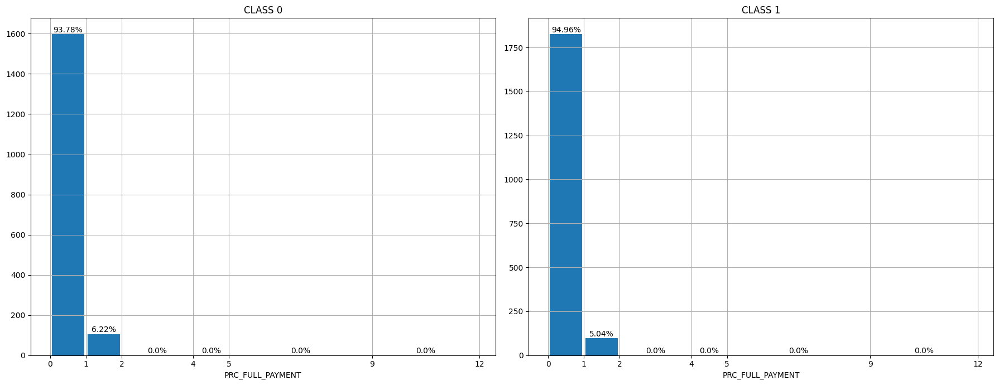

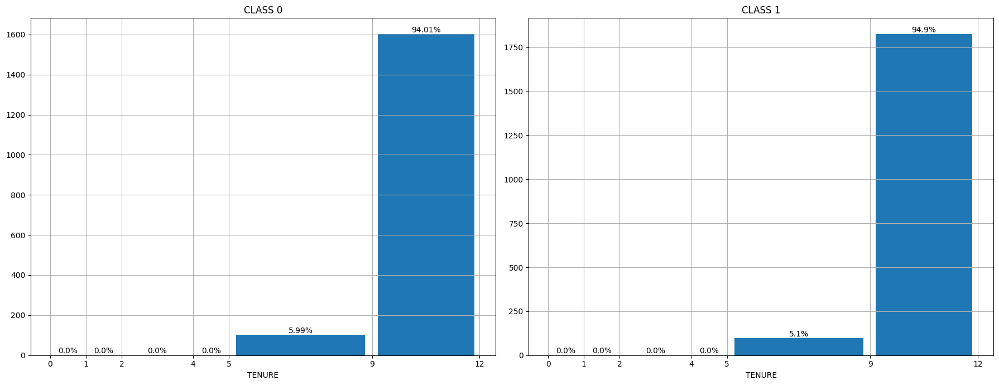

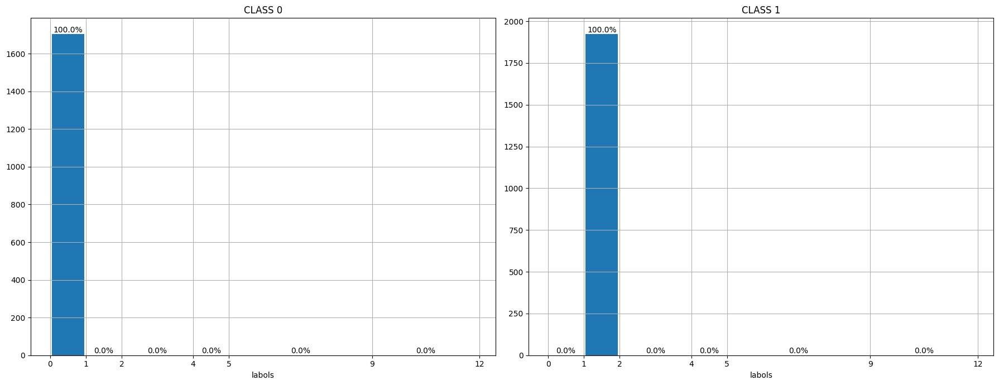

In [112]:
for i in log_scaled_data_copy.columns:
    Bar_subplots([group_dataframes[0],group_dataframes[1]], i, [0, 1, 2, 4, 5, 9, 12],0)


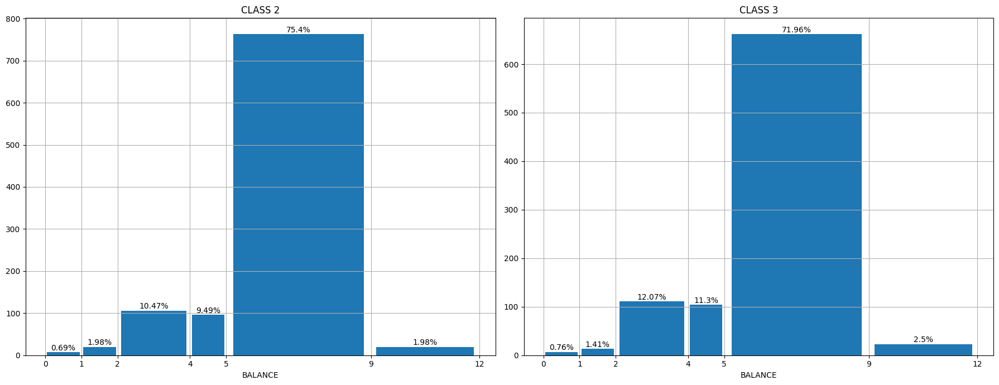

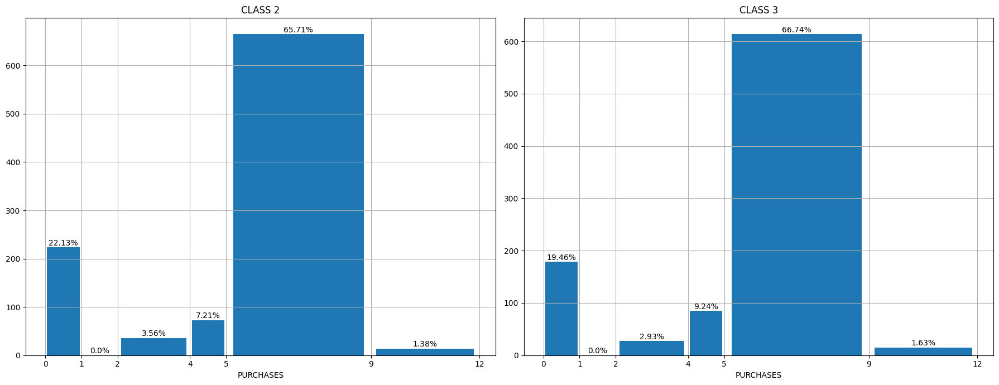

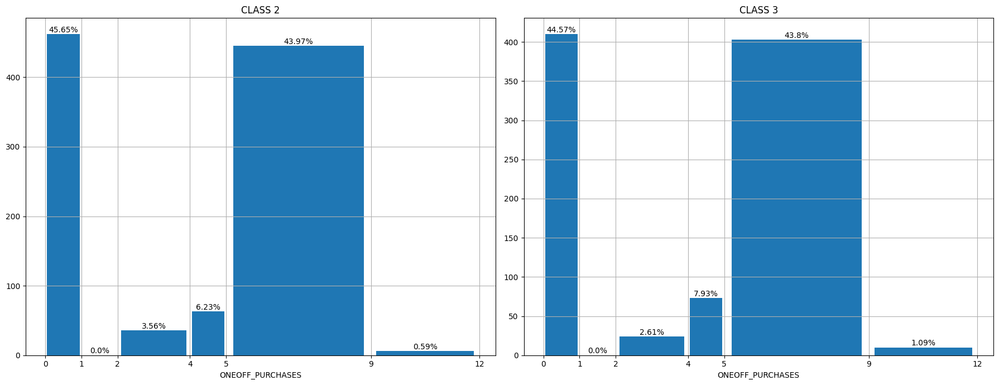

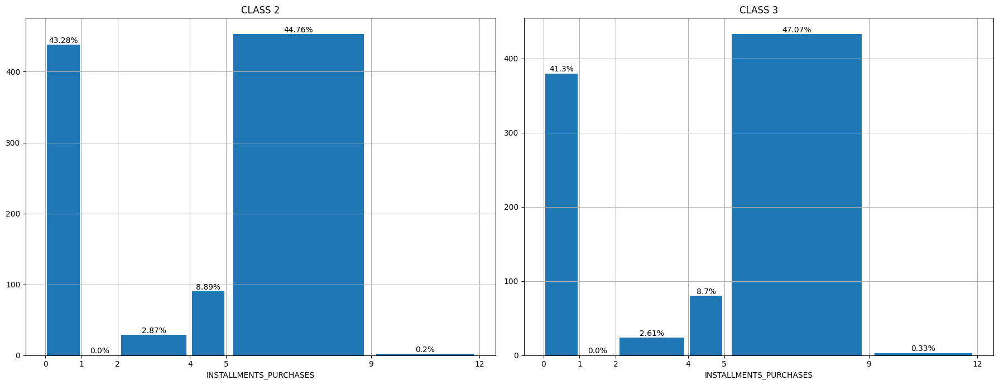

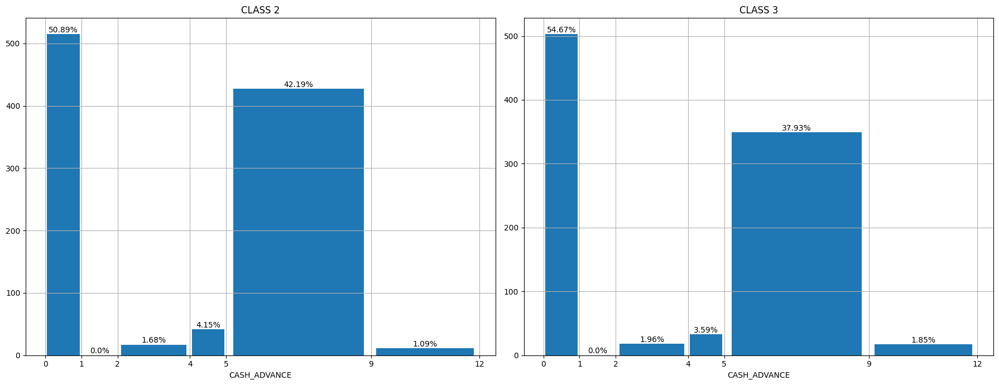

...

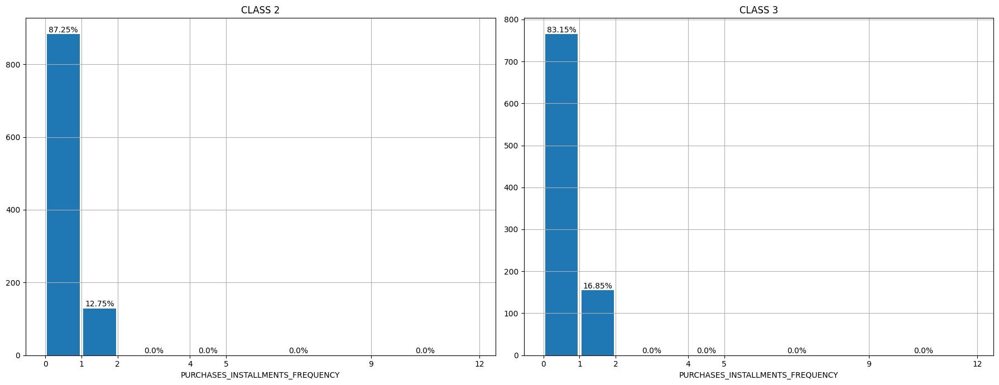

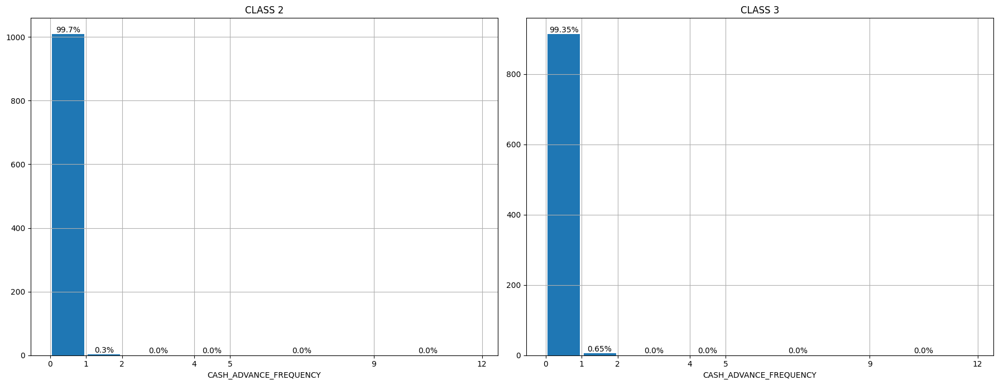

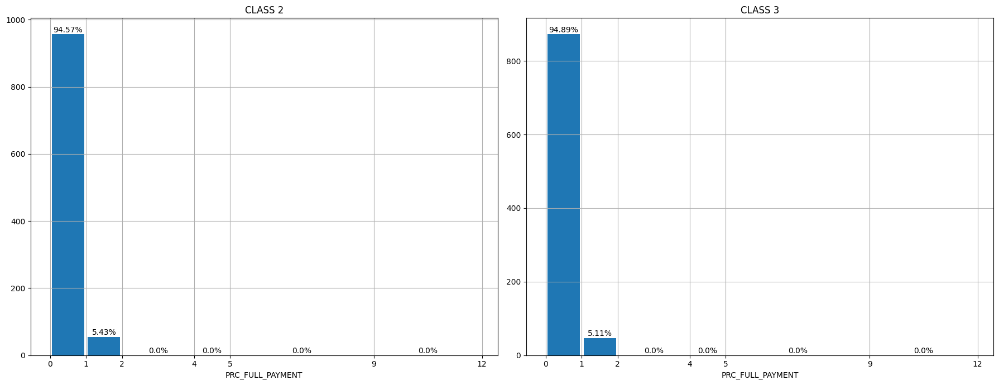

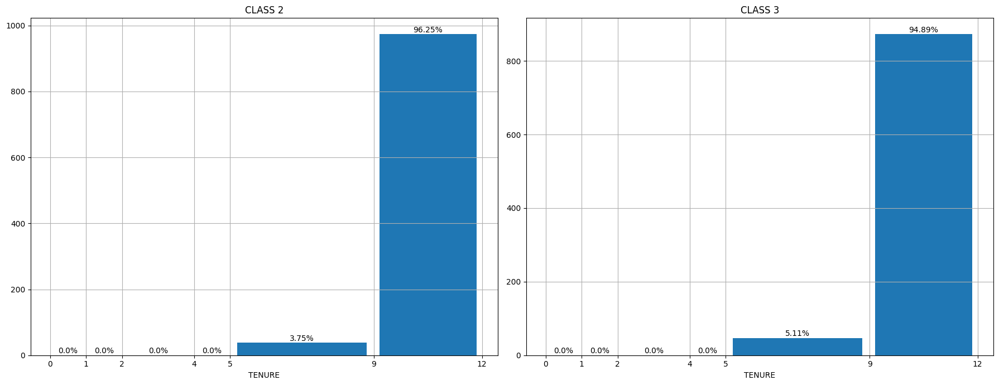

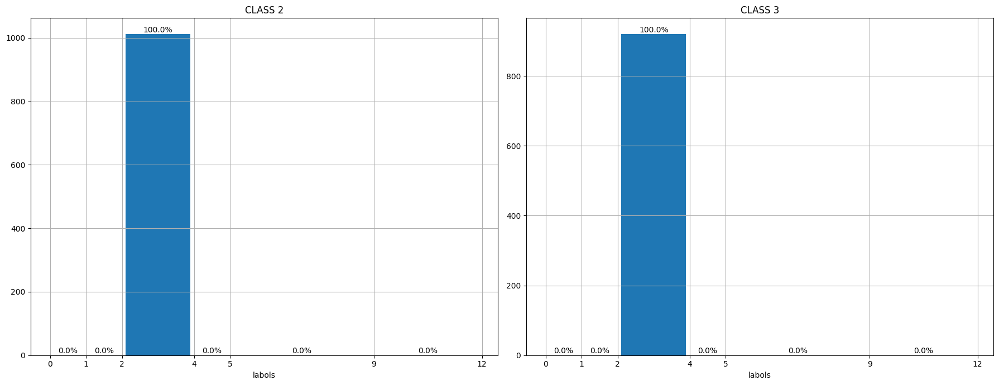

In [113]:
for i in log_scaled_data_copy.columns:
    Bar_subplots([group_dataframes[2],group_dataframes[3]], i, [0, 1, 2, 4, 5, 9, 12],2)


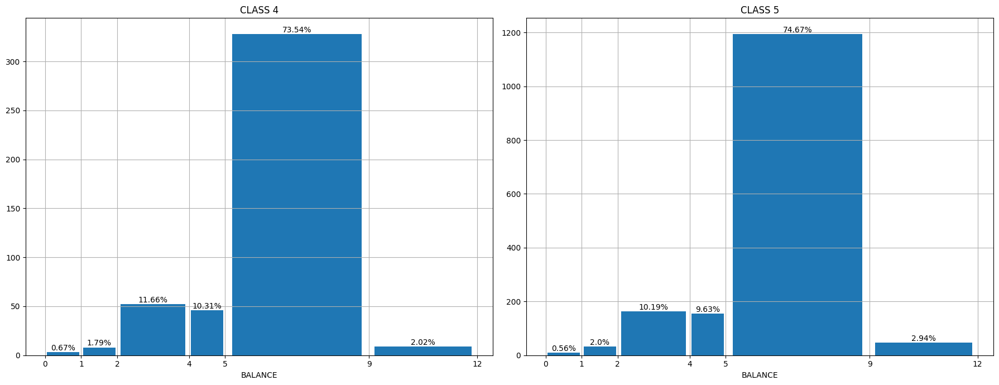

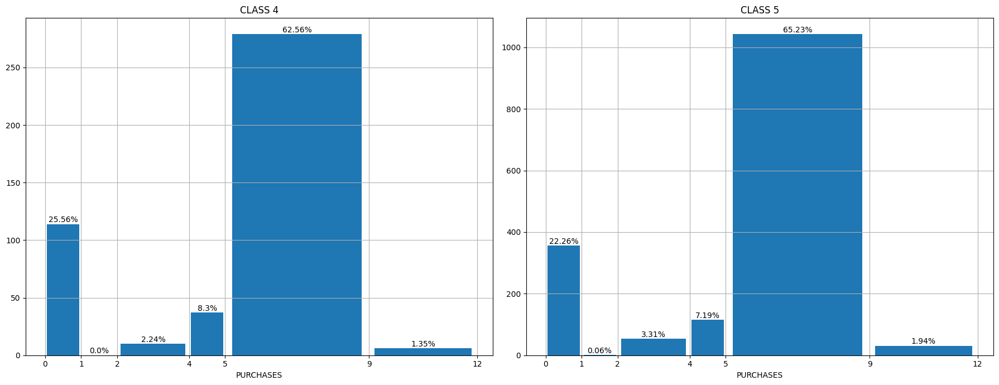

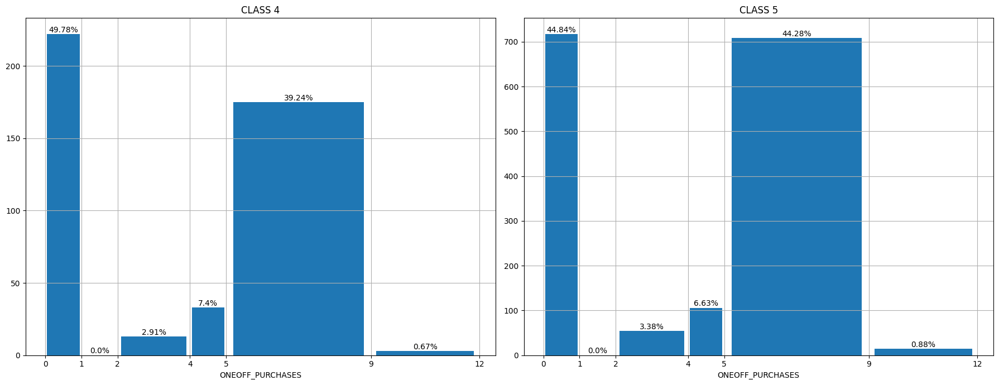

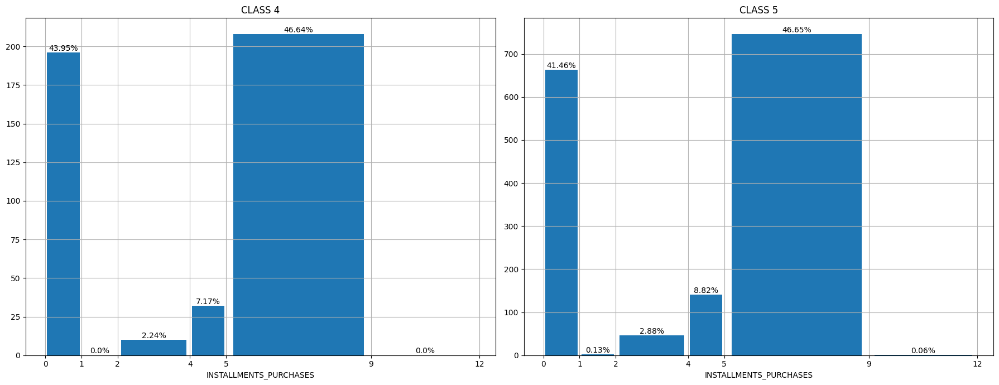

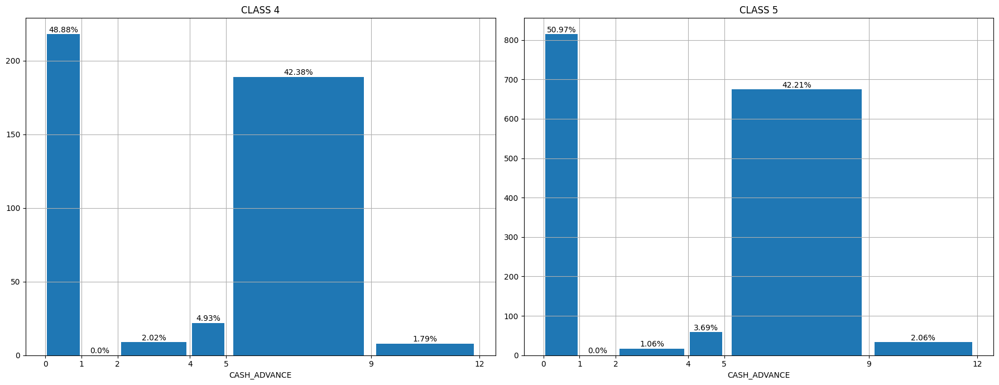

...

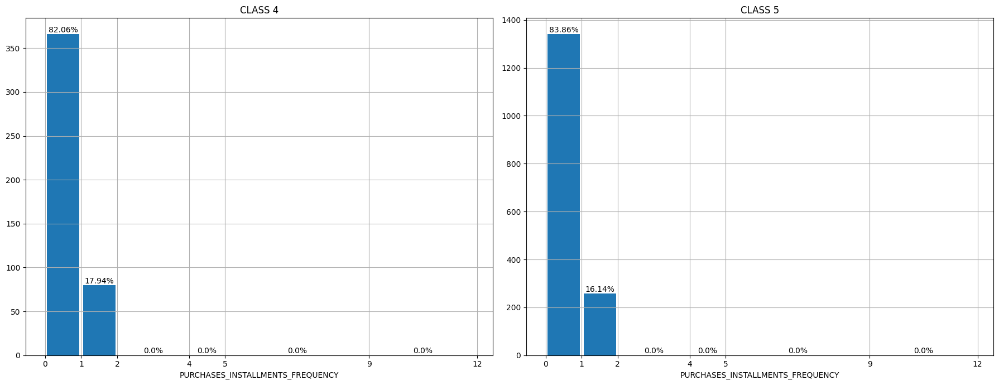

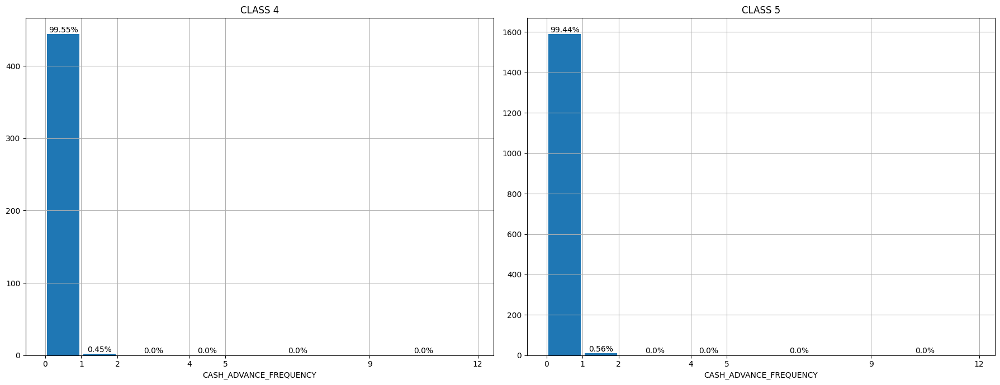

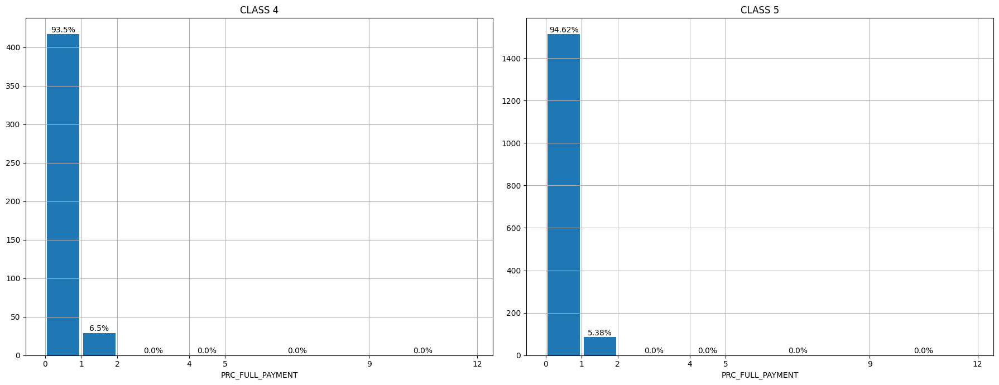

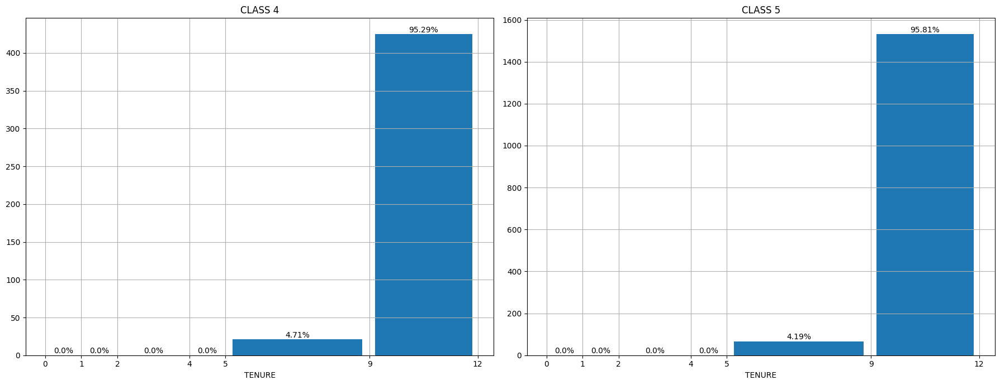

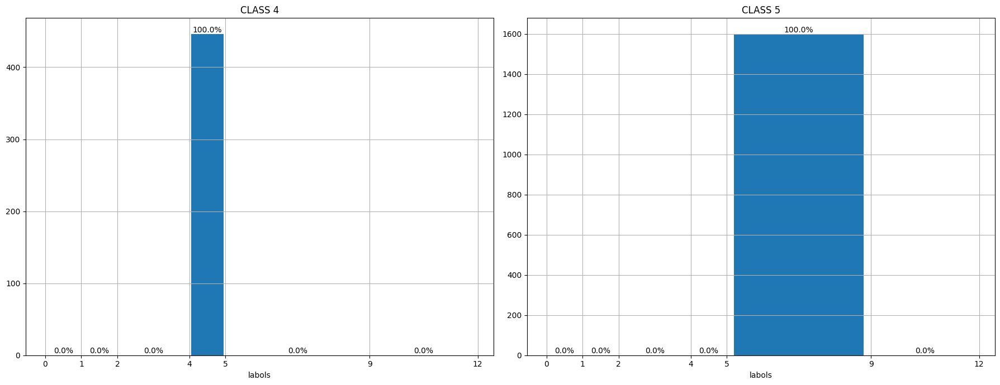

In [114]:
for i in log_scaled_data_copy.columns:
    Bar_subplots([group_dataframes[4],group_dataframes[5]], i, [0, 1, 2, 4, 5, 9, 12],4)


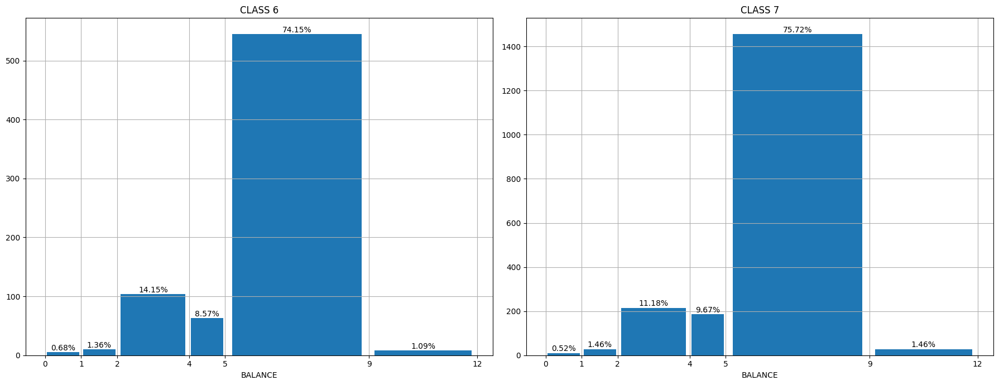

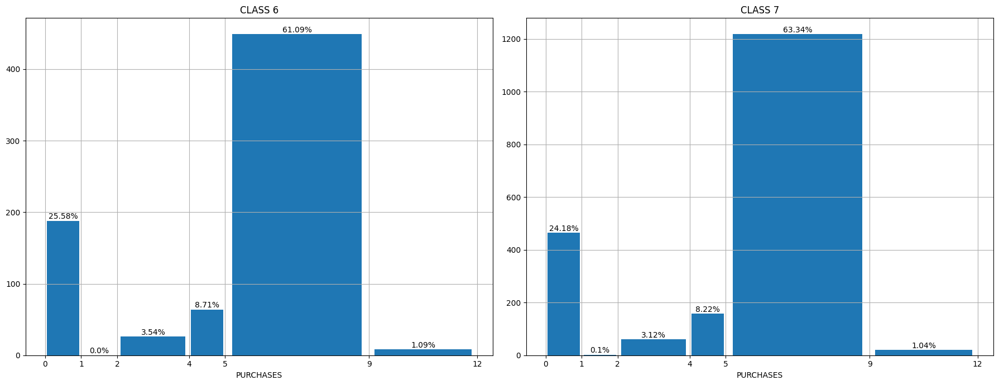

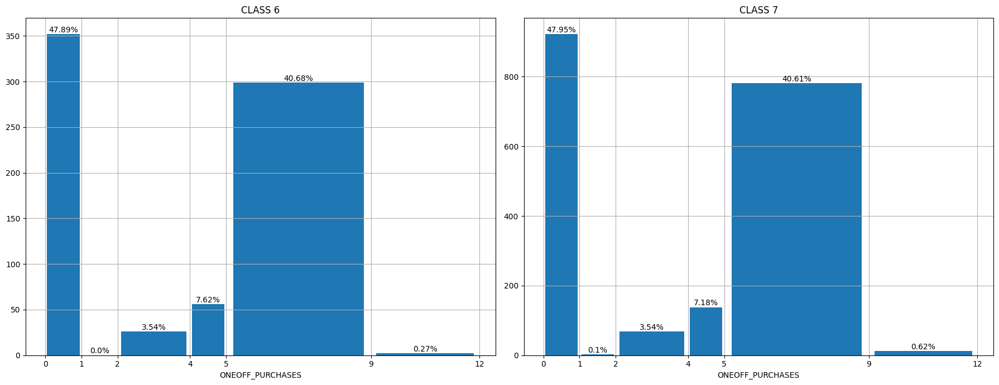

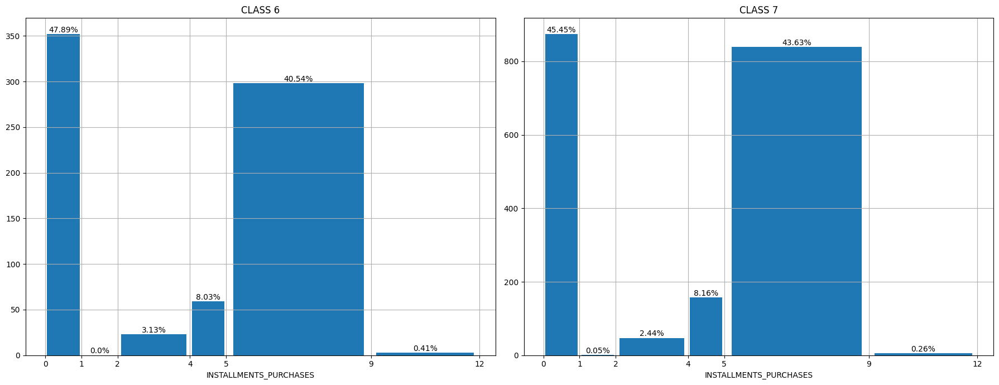

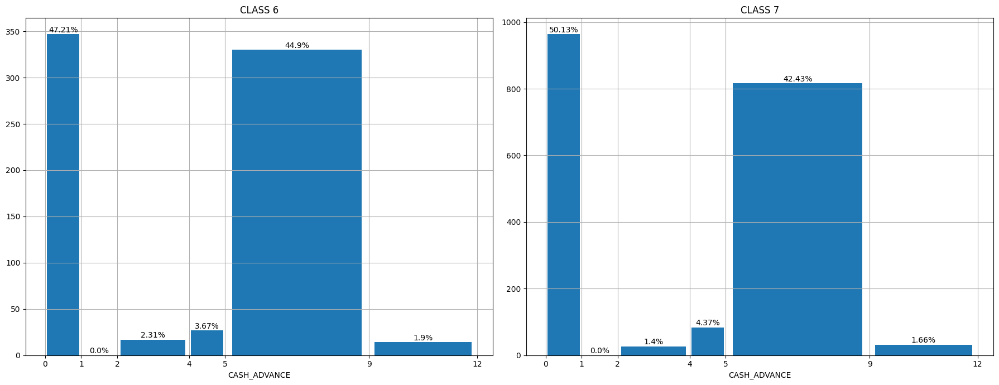

...

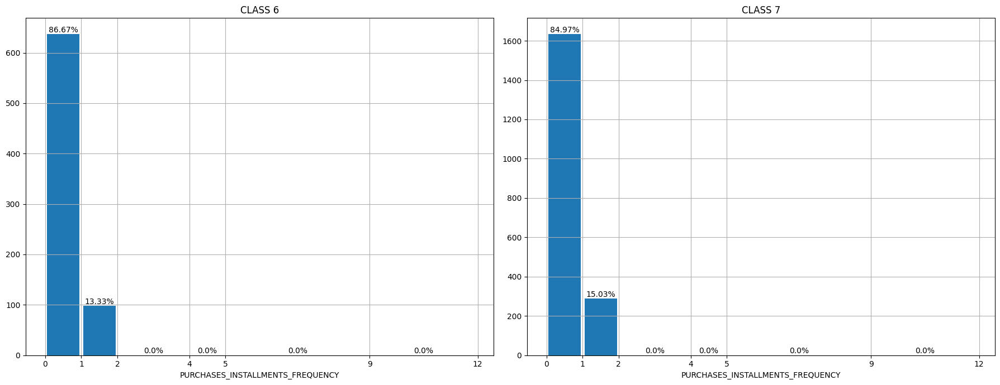

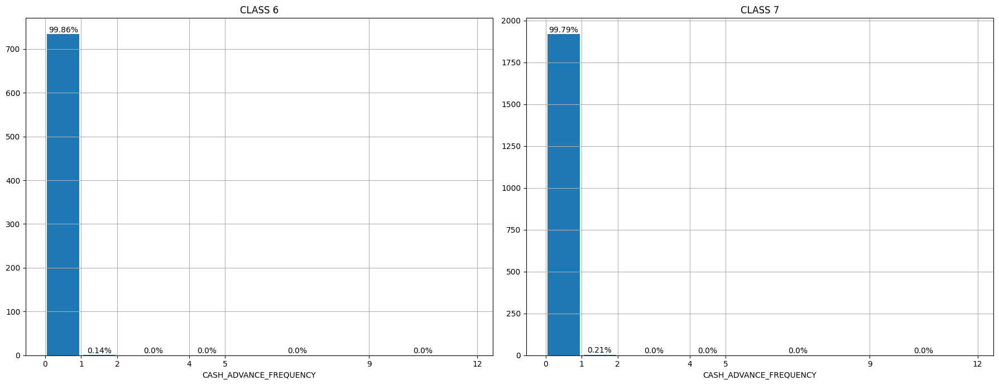

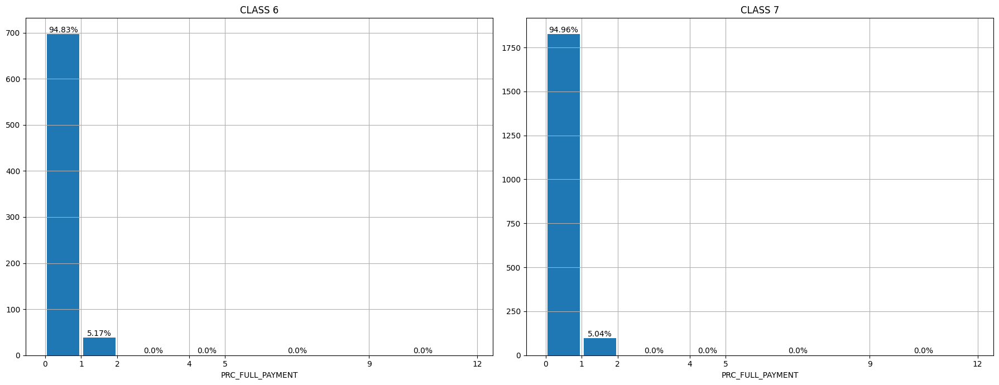

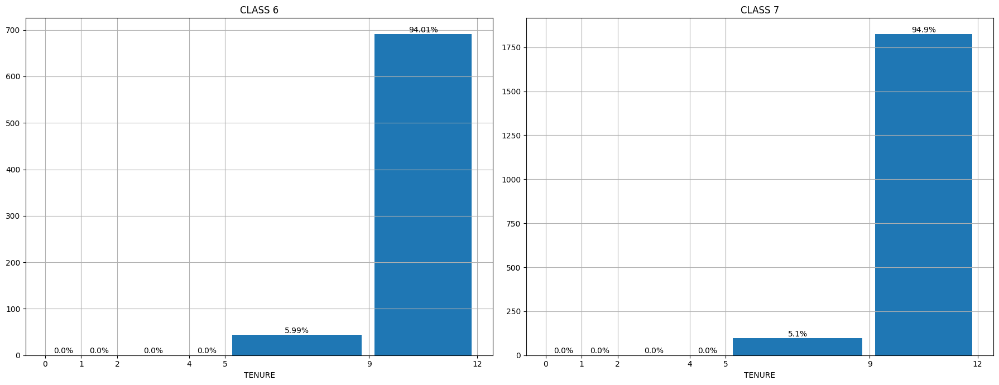

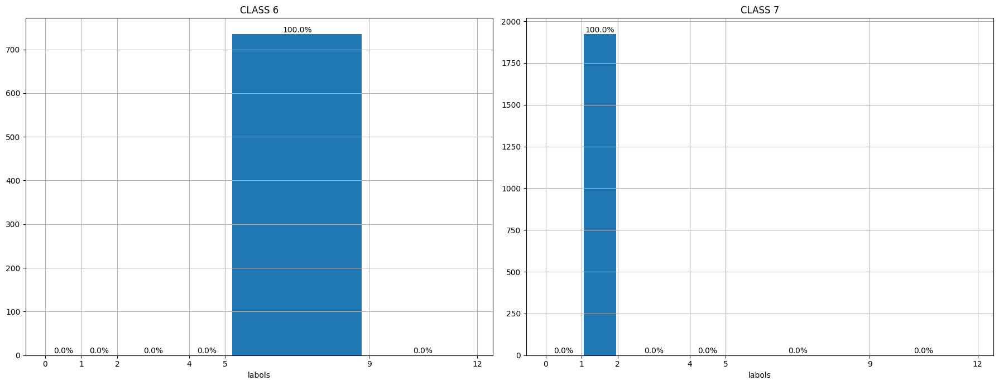

In [115]:
for i in log_scaled_data_copy.columns:
    Bar_subplots([group_dataframes[6],group_dataframes[1]], i, [0, 1, 2, 4, 5, 9, 12],6)
